All [REST](https://en.wikipedia.org/wiki/Representational_state_transfer) web services from the [Knowledge Systems Group](https://www.mskcc.org/research-areas/labs/nikolaus-schultz) we will be using in this tutorial have their REST APIs defined following the [Open API / Swagger specification](https://swagger.io/specification/). This allows us to use `bravado` to connect to them directly, and explore the API interactively.

For example this is how to connect to the [cBioPortal](https://www.cbioportal.org) API:

## Access cBioPortal API

In [8]:
from bravado.client import SwaggerClient

cbioportal = SwaggerClient.from_url('https://www.cbioportal.org/api/v2/api-docs',
                                config={"validate_requests":False,
                                        "validate_responses":False,
                                       "validate_swagger_spec": False})
print(cbioportal)

SwaggerClient(https://www.cbioportal.org/api)


In [9]:
%config Completer.use_jedi = False

## Collecting All Studies from the API

In [10]:
studies=cbioportal.Studies.getAllStudiesUsingGET(sortBy='importDate',projection='SUMMARY').result()

print("There are {} studies to look at overall, and each must be separated by year.".format(
    len(studies)
))

There are 462 studies to look at overall, and each must be separated by year.


In [11]:
cbioportal.Studies.getAllStudiesUsingGET(projection="SUMMARY").result()

[CancerStudy(allSampleCount=60, cancerType=None, cancerTypeId='acyc', citation='Ho et al. Nat Genet 2013', cnaSampleCount=None, completeSampleCount=None, description='Whole-exome or whole-genome sequencing analysis of 60 ACC tumor/normal pairs', groups='ACYC;PUBLIC', importDate='2023-12-06 19:10:40', massSpectrometrySampleCount=None, methylationHm27SampleCount=None, miRnaSampleCount=None, mrnaMicroarraySampleCount=None, mrnaRnaSeqSampleCount=None, mrnaRnaSeqV2SampleCount=None, name='Adenoid Cystic Carcinoma (MSK, Nat Genet 2013)', pmid='23685749', publicStudy=True, readPermission=True, referenceGenome='hg19', rppaSampleCount=None, sequencedSampleCount=None, status=0, studyId='acyc_mskcc_2013', treatmentCount=None),
 CancerStudy(allSampleCount=28, cancerType=None, cancerTypeId='acyc', citation='Ross et al. Am J Surg Pathl 2014', cnaSampleCount=None, completeSampleCount=None, description='Targeted Sequencing of 28 metastatic Adenoid Cystic Carcinoma samples.', groups='ACYC;PUBLIC', impor

## Extracting Years, Study Names, and Cancer Types

In [12]:
studies = cbioportal.Studies.getAllStudiesUsingGET().result()
{k:getattr(studies, k) for k in dir(studies)}

{'__add__': <method-wrapper '__add__' of list object at 0x16a284c80>,
 '__class__': list,
 '__class_getitem__': <function list.__class_getitem__>,
 '__contains__': <method-wrapper '__contains__' of list object at 0x16a284c80>,
 '__delattr__': <method-wrapper '__delattr__' of list object at 0x16a284c80>,
 '__delitem__': <method-wrapper '__delitem__' of list object at 0x16a284c80>,
 '__dir__': <function list.__dir__()>,
 '__doc__': 'Built-in mutable sequence.\n\nIf no argument is given, the constructor creates a new empty list.\nThe argument must be an iterable if specified.',
 '__eq__': <method-wrapper '__eq__' of list object at 0x16a284c80>,
 '__format__': <function list.__format__(format_spec, /)>,
 '__ge__': <method-wrapper '__ge__' of list object at 0x16a284c80>,
 '__getattribute__': <method-wrapper '__getattribute__' of list object at 0x16a284c80>,
 '__getitem__': <function list.__getitem__(index, /)>,
 '__getstate__': <function list.__getstate__()>,
 '__gt__': <method-wrapper '__g

In [13]:
import pandas as pd

df_failure = pd.DataFrame.from_dict([
dict(
    {k:getattr(s,k) for k in dir(s)},
    **{k:getattr(s.studyId,k) for k in dir(s.studyId)})
    for s in studies
])

In [14]:
df.columns

NameError: name 'df' is not defined

In [ ]:
df_failure['name allSampleCount citation'.split()].head()

,name,allSampleCount,citation
0,"Adenoid Cystic Carcinoma (MSK, Nat Genet 2013)",60,Ho et al. Nat Genet 2013
1,"Adenoid Cystic Carcinoma (FMI, Am J Surg Pathl...",28,Ross et al. Am J Surg Pathl 2014
2,"Adenoid Cystic Carcinoma (JHU, Cancer Prev Res...",25,"Rettig et al, Cancer Prev Res 2016"
3,"Adenoid Cystic Carcinoma (MDA, Clin Cancer Res...",102,Mitani et al. Clin Cancer Res 2015
4,"Adenoid Cystic Carcinoma (MGH, Nat Gen 2016)",10,Drier et al. Nature Genetics 2016


In [ ]:
import numpy as np
import pandas as pd

df_failure = pd.DataFrame.from_dict([
dict(
    {k:getattr(s,k) for k in dir(s)},
    **{k:getattr(s.studyId,k) for k in dir(s.studyId)})
    for s in studies
])
df_failure['name allSampleCount'.split()].head()

# Permanently changes the pandas settings
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

# All dataframes hereafter reflect these changes.
display(df_failure)
df_failure['name allSampleCount'.split()].head()

print('**RESET_OPTIONS**')

# Resets the options
pd.reset_option('all')
display(df_failure)


,allSampleCount,cancerType,cancerTypeId,citation,cnaSampleCount,completeSampleCount,description,groups,importDate,massSpectrometrySampleCount,methylationHm27SampleCount,miRnaSampleCount,mrnaMicroarraySampleCount,mrnaRnaSeqSampleCount,mrnaRnaSeqV2SampleCount,name,pmid,publicStudy,readPermission,referenceGenome,rppaSampleCount,sequencedSampleCount,status,studyId,treatmentCount,__add__,__class__,__contains__,__delattr__,__dir__,__doc__,__eq__,__format__,__ge__,__getattribute__,__getitem__,__getnewargs__,__getstate__,__gt__,__hash__,__init__,__init_subclass__,__iter__,__le__,__len__,__lt__,__mod__,__mul__,__ne__,__new__,__reduce__,__reduce_ex__,__repr__,__rmod__,__rmul__,__setattr__,__sizeof__,__str__,__subclasshook__,capitalize,casefold,center,count,encode,endswith,expandtabs,find,format,format_map,index,isalnum,isalpha,isascii,isdecimal,isdigit,isidentifier,islower,isnumeric,isprintable,isspace,istitle,isupper,join,ljust,lower,lstrip,maketrans,partition,removeprefix,removesuffix,replace,rfind,rindex,rjust,rpartition,rsplit,rstrip,split,splitlines,startswith,strip,swapcase,title,translate,upper,zfill
0,60,None,acyc,Ho et al. Nat Genet 2013,None,None,Whole-exome or whole-genome sequencing analysis of 60 ACC tumor/normal pairs,ACYC;PUBLIC,2023-12-06 19:10:40,None,None,None,None,None,None,"Adenoid Cystic Carcinoma (MSK, Nat Genet 2013)",23685749,True,True,hg19,None,None,0,acyc_mskcc_2013,None,<method-wrapper '__add__' of str object at 0x309ba6f70>,<class 'str'>,<method-wrapper '__contains__' of str object at 0x309ba6f70>,<method-wrapper '__delattr__' of str object at 0x309ba6f70>,<built-in method __dir__ of str object at 0x309ba6f70>,"str(object='') -> str\nstr(bytes_or_buffer[, encoding[, errors]]) -> str\n\nCreate a new string object from the given object. If encoding or\nerrors is specified, then the object must expose a data buffer\nthat will be decoded using the given encoding and error handler.\nOtherwise, returns the result of object.__str__() (if defined)\nor repr(object).\nencoding defaults to sys.getdefaultencoding().\nerrors defaults to 'strict'.",<method-wrapper '__eq__' of str object at 0x309ba6f70>,<built-in method __format__ of str object at 0x309ba6f70>,<method-wrapper '__ge__' of str object at 0x309ba6f70>,<method-wrapper '__getattribute__' of str object at 0x309ba6f70>,<method-wrapper '__getitem__' of str object at 0x309ba6f70>,<built-in method __getnewargs__ of str object at 0x309ba6f70>,<built-in method __getstate__ of str object at 0x309ba6f70>,<method-wrapper '__gt__' of str object at 0x309ba6f70>,<method-wrapper '__hash__' of str object at 0x309ba6f70>,<method-wrapper '__init__' of str object at 0x309ba6f70>,<built-in method __init_subclass__ of type object at 0x102e1d5d8>,<method-wrapper '__iter__' of str object at 0x309ba6f70>,<method-wrapper '__le__' of str object at 0x309ba6f70>,<method-wrapper '__len__' of str object at 0x309ba6f70>,<method-wrapper '__lt__' of str object at 0x309ba6f70>,<method-wrapper '__mod__' of str object at 0x309ba6f70>,<method-wrapper '__mul__' of str object at 0x309ba6f70>,<method-wrapper '__ne__' of str object at 0x309ba6f70>,<built-in method __new__ of type object at 0x102e1d5d8>,<built-in method __reduce__ of str object at 0x309ba6f70>,<built-in method __reduce_ex__ of str object at 0x309ba6f70>,<method-wrapper '__repr__' of str object at 0x309ba6f70>,<method-wrapper '__rmod__' of str object at 0x309ba6f70>,<method-wrapper '__rmul__' of str object at 0x309ba6f70>,<method-wrapper '__setattr__' of str object at 0x309ba6f70>,<built-in method __sizeof__ of str object at 0x309ba6f70>,<method-wrapper '__str__' of str object at 0x309ba6f70>,<built-in method __subclasshook__ of type object at 0x102e1d5d8>,<built-in method capitalize of str object at 0x309ba6f70>,<built-in method casefold of str object at 0x309ba6f70>,<built-in method center of str object at 0x309ba6f70>,<built-in method count of str object at 0x309ba6f70>,<built-in method encode of str object at 0x309ba6f70>,<built-in m

**RESET_OPTIONS**


/var/folders/ss/k0lqmw8j49qcd4xkkmsnr20d7682fy/T/ipykernel_2049/2745521059.py:25: FutureWarning: data_manager option is deprecated and will be removed in a future version. Only the BlockManager will be available.
  pd.reset_option('all')
/var/folders/ss/k0lqmw8j49qcd4xkkmsnr20d7682fy/T/ipykernel_2049/2745521059.py:25: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  pd.reset_option('all')


,allSampleCount,cancerType,cancerTypeId,citation,cnaSampleCount,completeSampleCount,description,groups,importDate,massSpectrometrySampleCount,...,rstrip,split,splitlines,startswith,strip,swapcase,title,translate,upper,zfill
0,60,None,acyc,Ho et al. Nat Genet 2013,None,None,Whole-exome or whole-genome sequencing analysi...,ACYC;PUBLIC,2023-12-06 19:10:40,None,...,<built-in method rstrip of str object at 0x309...,<built-in method split of str object at 0x309b...,<built-in method splitlines of str object at 0...,<built-in method startswith of str object at 0...,<built-in method strip of str object at 0x309b...,<built-in method swapcase of str object at 0x3...,<built-in method title of str object at 0x309b...,<built-in method translate of str object at 0x...,<built-in method upper of str object at 0x309b...,<built-in method zfill of str object at 0x309b...
1,28,None,acyc,Ross et al. Am J Surg Pathl 2014,None,None,Targeted Sequencing of 28 metastatic Adenoid C...,ACYC;PUBLIC,2023-12-06 19:11:06,None,...,<built-in method rstrip of str object at 0x309...,<built-in method split of str object at 0x309b...,<built-in method splitlines of str object at 0...,<built-in method startswith of str object at 0...,<built-in method strip of str object at 0x309b...,<built-in method swapcase of str object at 0x3...,<built-in method title of str object at 0x309b...,<built-in method translate of str object at 0x...,<built-in method upper of str object at 0x309b...,<built-in method zfill of str object at 0x309b...
2,25,None,acyc,"Rettig et al, Cancer Prev Res 2016",None,None,Whole-genome or whole-exome sequencing of 25 a...,ACYC;PUBLIC,2023-12-06 19:11:07,None,...,<built-in method rstrip of str object at 0x30d...,<built-in method split of str object at 0x30d1...,<built-in method splitlines of str object at 0...,<built-in method startswith of str object at 0...,<built-in method strip of str object at 0x30d1...,<built-in method swapcase of str object at 0x3...,<built-in method title of str object at 0x30d1...,<built-in method translate of str object at 0x...,<built-in method upper of str object at 0x30d1...,<built-in method zfill of str object at 0x30d1...
3,102,None,acyc,Mitani et al. Clin Cancer Res 2015,None,None,WGS of 21 salivary ACCs and targeted molecular...,ACYC;PUBLIC,2023-12-06 19:11:08,None,...,<built-in method rstrip of str object at 0x30d...,<built-in method split of str object at 0x30d1...,<built-in method splitlines of str object at 0...,<built-in method startswith of str object at 0...,<built-in method strip of str object at 0x30d1...,<built-in method swapcase of str object at 0x3...,<built-in method title of str object at 0x30d1...,<built-in method translate of str object at 0x...,<built-in method upper of str object at 0x30d1...,<built-in method zfill of str object at 0x30d1...
4,10,None,acyc,Drier et al. Nature Genetics 2016,None,None,Whole-genome/exome sequencing of 10 ACC PDX mo...,ACYC,2023-12-06 19:11:09,None,...,<built-in method rstrip of str object at 0x175...,<built-in method split of str object at 0x1752...,<built-in method splitlines of str object at 0...,<built-in method startswith of str object at 0...,<built-in method strip of str object at 0x1752...,<built-in method swapcase of str object at 0x1...,<built-in method title of str object at 0x1752...,<built-in method translate of str object at 0x...,<built-in method upper of str object at 0x1752...,<built-in method zfill of str object at 0x1752...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
457,139,None,pancreas,None,None,None,CPTAC Pancreatic Cancer. Source data from GDC ...,PUBLIC,2024-07-28 10:38:16,None,...,<built-in method rstrip of str object at 0x177...,<built-in method split of str object at 0x1773...,<built-in method splitlines of str object at 0...,<built-in method startswith of str object at 0...,<built-in method strip of str object at 0x1773...,<built-in method swapcase of str object at 0x1...,<built-in method title of s

/var/folders/ss/k0lqmw8j49qcd4xkkmsnr20d7682fy/T/ipykernel_2049/3211150052.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  f.set_xticklabels(f.get_xticklabels(), rotation=90)


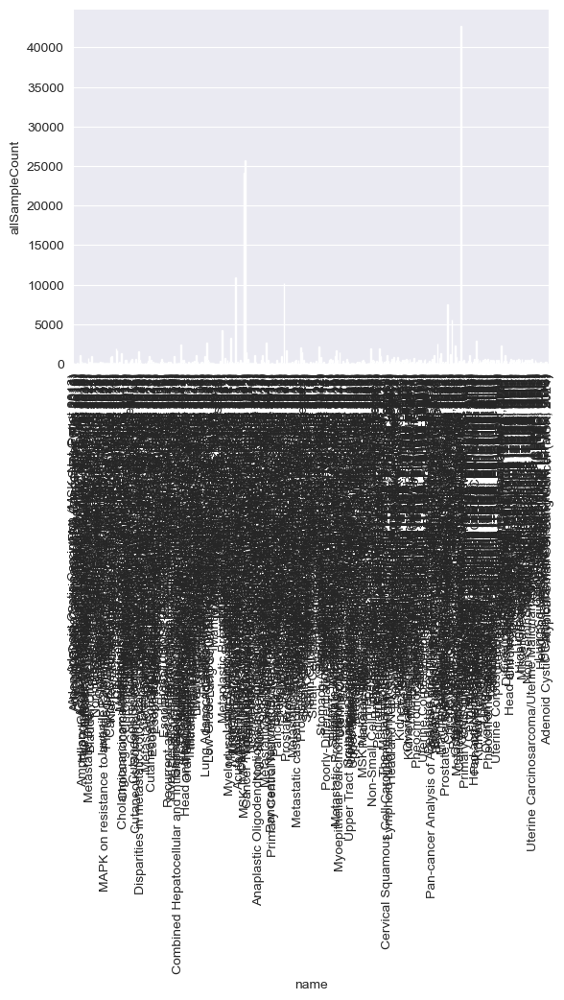

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

f = sns.barplot(x='name', y='allSampleCount', data = df_failure)
f.set_xticklabels(f.get_xticklabels(), rotation=90) 

sns.axes_style("white")
sns.set_style("darkgrid")
plt.show()

In [ ]:
import pandas as pd

# Sample DataFrame (with a potential issue)
data = {
    "citation": [
        'Adenoid Cystic Carcinoma of the Breast (MSK, J Pathol. 2015)', 
        'Adenoid Cystic Carcinoma (MSK, Nat Genet 2013)', 
        'Adenoid Cystic Carcinoma (FMI, Am J Surg Pathl. 2014)', 
        'Adenoid Cystic Carcinoma (JHU, Cancer Prev Res 2016)', 
        'Adenoid Cystic Carcinoma (MDA, Clin Cancer Res 2015)', 
        'Adenoid Cystic Carcinoma (MGH, Nat Gen 2016)', 
        'Adenoid Cystic Carcinoma (Sanger/MDA, JCI 2013)', 
        'Adenoid Cystic Carcinoma Project (J Clin Invest 2019)', 
        'Basal Cell Carcinoma (UNIGE, Nat Genet 2016)', 
        'Acute Lymphoblastic Leukemia (St Jude, Nat Genet 2015)', 
        'Ampullary Carcinoma (Baylor College of Medicine, Cell Reports 2016)', 
        'Hypodiploid Acute Lymphoid Leukemia (St Jude, Nat Genet 2013)', 
        'Acute Lymphoblastic Leukemia (St Jude, Nat Genet 2016)', 
        'The Angiosarcoma Project - Count Me In (Nature Medicine, 2020)', 
        'Breast Fibroepithelial Tumors (Duke-NUS, Nat Genet 2015)', 
        'Acute Myeloid Leukemia (OHSU, Nature 2018)', 
        'Appendiceal Cancer (MSK, J Clin Oncol 2022)', 
        'Metastatic Biliary Tract Cancers (SUMMIT - Neratinib Basket Trial, 2022)', 
        'Acute Myeloid Leukemia (OHSU, Cancer Cell 2022)', 
        'Bladder Urothelial Carcinoma (DFCI/MSK, Cancer Discov 2014)', 
        'Bladder Cancer (MSK, J Clin Onco 2013)', 
        'Bladder Urothelial Carcinoma (BGI, Nat Genet 2013)', 
        'Bladder Cancer (MSK, Eur Urol 2014)', 
        'Nonmuscle Invasive Bladder Cancer (MSK Eur Urol 2017)',
        'Bladder Cancer (MSK, Nat Genet 2016)', 
        'Breast Invasive Carcinoma (Broad, Nature 2012)', 
        'Bladder Urothelial Carcinoma (TCGA, Nature 2014)', 
        'Pediatric Brain Cancer (CPTAC/CHOP, Cell 2020)', 
        'Colorectal Adenocarcinoma (MSK, Nat Commun 2022)', 
        'Metastatic Breast Cancer (INSERM, PLoS Med 2016)', 
        'Breast Cancer (MSK, NPJ Breast Cancer 2019)', 
        'Juvenile Papillomatosis and Breast Cancer (MSK,J Pathol. 2015)', 
        'MAPK on resistance to anti-HER2 therapy for breast cancer (MSK, Nat Commun. 2022)', 
        'Breast Cancer (MSK, Clinical Cancer Res 2020)', 
        'Proteogenomic landscape of breast cancer (CPTAC, Cell 2020)', 
        'Breast Cancer (HTAN, 2022)', 'Breast Invasive Carcinoma (Sanger, Nature 2012)', 
        'Breast Invasive Carcinoma (TCGA, Nature 2012)', 
        'Cancer Cell Line Encyclopedia (Novartis/Broad, Nature 2012)', 
        'Kidney Renal Clear Cell Carcinoma (IRC, Nat Genet 2014)', 
        'Renal Clear Cell Carcinoma (UTokyo, Nat Genet 2013)', 
        'NCI-60 Cell Lines (NCI, Cancer Res 2012)', 
        'Breast Cancer (MSK, Cancer Cell 2018)', 
        'Cancer Cell Line Encyclopedia (Broad, 2019)', 
        'Breast Cancer (MSK, Nature Cancer 2020)', 
        'Breast Cancer (SMC 2018)', 
        'Clear Cell Renal Cell Carcinoma (DFCI, Science 2019)', 
        'Metastatic Breast Cancer (MSK, Cancer Discovery 2022)', 
        'Intrahepatic Cholangiocarcinoma (JHU, Nat Genet 2013)', 
        'Cholangiocarcinoma (National Cancer Centre of Singapore, Nat Genet 2013)', 
        'Cholangiocarcinoma (National University of Singapore, Nat Genet 2012)', 
        'Chronic Lymphocytic Leukemia (IUOPA, Nature 2015)', 
        'Chronic Lymphocytic Leukemia (Broad, Nature 2015)', 
        'Chronic lymphocytic leukemia (ICGC, Nature Genetics 2011)', 
        'Colon Adenocarcinoma (CaseCCC, PNAS 2015)', 
        'Cholangiocarcinoma (MSK, Clin Cancer Res 2018)', 
        'Cholangiocarcinoma (ICGC, Cancer Discov 2017)', 
        'Colorectal Adenocarcinoma (TCGA, Firehose Legacy)', 
        'Colorectal Adenocarcinoma (Genentech, Nature 2012)', 
        'Colorectal Adenocarcinoma Triplets (MSK, Genome Biol 2014)', 
        'Cutaneous Squamous Cell Carcinoma (DFCI, Clin Cancer Res 2015)', 
        'Colorectal Adenocarcinoma (DFCI, Cell Reports 2016)',
        'Cutaneous Squamous Cell Carcinoma (MD Anderson, Clin) Cancer Res 2014)',
        'Colon Cancer (CPTAC-2 Prospective, Cell 2019)',
        'Colorectal Cancer (MSK, JNCI 2021)',
        'Colorectal Cancer (MSK, Gastroenterology 2020)',
        'Disparities in metastatic colorectal cancer between Africans and Americans (MSK, 2020)',
        'Colorectal Cancer (MSK, JCO Precis Oncol 2022)',
        'Colorectal Cancer (MSK, Cancer Discovery 2022)',
        'Desmoplastic Melanoma (Broad Institute, Nat Genet 2015)',
        'Gastric Adenocarcinoma (TMUCIH, PNAS 2015)',
        'Cutaneous T Cell Lymphoma (Columbia U, Nat Genet 2015)',
        'Diffuse Large B-Cell Lymphoma (Broad, PNAS 2012)',
        'Metastatic Esophagogastric Cancer (MSK, Cancer Discovery 2017)',
        'Diffuse Large B-Cell Lymphoma (Duke, Cell 2017)',
        'Diffuse Large B Cell Lymphoma (DFCI, Nat Med 2018)',
        'Esophageal/Stomach Cancer (MSK, 2020)',
        'Cutaneous Squamous Cell Carcinoma (UCSF, NPJ Genom Med 2021)',
        'Esophagogastric Cancer (MSK, Clin Cancer Res 2022)',
        'Esophageal Squamous Cell Carcinoma (UCLA, Nat Genet 2014)',
        'Esophageal Adenocarcinoma (DFCI, Nat Genet 2013)',
        'Esophageal Squamous Cell Carcinoma (ICGC, Nature 2014)',
        'Pediatric Ewing Sarcoma (DFCI, Cancer Discov 2014)',
        'Ewing Sarcoma (Institut Curie, Cancer Discov 2014)',
        'Gallbladder Carcinoma (Shanghai, Nat Genet 2014)',
        'Glioblastoma (TCGA, Nature 2008)',
        'Glioblastoma (TCGA, Cell 2013)',
        'Germ Cell Tumors (MSK, J Clin Oncol 2016)',
        'Gallbladder Cancer (MSK, Cancer 2018)' 'Brain Tumor PDXs (Mayo Clinic, Clin Cancer Res 2020)',
        'Esophageal Cancer-TRAP Project (MSK, Lancet Oncol 2020)',
        'Glioblastoma (Columbia, Nat Med. 2019)',
        'Glioblastoma (CPTAC, Cell 2021)',
        'Gallbladder Cancer (MSK, 2022)',
        'Recurrent and Metastatic Head & Neck Cancer (MSK, JAMA Oncol 2016)',
        'Hepatocellular Carcinomas (INSERM, Nat Genet 2015)',
        'Hepatocellular Carcinoma (MSK, Clin Cancer Res 2018)',
        'Liver Hepatocellular Adenoma and Carcinomas (MSK, PLOS One 2018)',
        'Glioma (MSK, Clin Cancer Res 2019)',
        'Glioma (MSK, Nature 2019)',
        'Histiocytosis Cobimetinib (MSK, Nature 2019)',
        'Germ Cell Tumors and Shared Leukemias (MSK, J Clin Invest 2020)',
        'Combined Hepatocellular and Intrahepatic Cholangiocarcinoma (Peking University, Cancer Cell 2019)',
        'High-Grade Serous Ovarian Cancer (MSK, NPJ Genome Med 2021)',
        'Hepatocellular Carcinoma (MERiC/Basel, Nat Commun. 2022)',
        'MSK-IMPACT Heme Tumors (MSK, 2022)',
        'Gastrointestinal Stromal Tumor (MSK, NPJ Precis Oncol 2023)',
        'Kidney Renal Clear Cell Carcinoma (BGI, Nat Genet 2012)',
        'Kidney Renal Clear Cell Carcinoma (TCGA, Nature 2013)',
        'Kidney Chromophobe (TCGA, Cancer Cell 2014)',
        'Head and Neck Squamous Cell Carcinoma (Broad, Science 2011)',
        'Head and Neck Squamous Cell Carcinoma (Johns Hopkins, Science 2011)',
        'Head and Neck Squamous Cell Carcinoma (TCGA, Nature 2015)',
        'Oral Squamous Cell Carcinoma (MD Anderson, Cancer Discov 2013)',
        'Chronic Lymphocytic Leukemia (Broad, Cell 2013)',
        'Intrahepatic Cholangiocarcinoma (Shanghai, Nat Commun 2014)',
        'Intrahepatic Cholangiocarcinoma (MSK, Clin Cancer Res 2021)',
        'Intrahepatic Cholangiocarcinoma (Mount Sinai 2015)',
        'Intrahepatic Cholangiocarcinoma (MSK, Hepatology 2021)',
        'Low-Grade Gliomas (UCSF, Science 2014)',
        'Merged Cohort of LGG and GBM (TCGA, Cell 2016)',
        'Liver Hepatocellular Carcinoma (AMC, Hepatology 2014)',
        'Liver Hepatocellular Carcinoma (RIKEN, Nat Genet 2012)',
        'Lung Adenocarcinoma (MSK, Science 2015)',
        'Lung Adenocarcinoma (Broad, Cell 2012)',
        'Lung Adenocarcinoma (TCGA, Nature 2014)',
        'Lung Adenocarcinoma (TSP, Nature 2008)',
        'Hepatocellular Adenoma (INSERM, Cancer Cell 2014)',
        'Non-Small Cell Cancer (MSK, Cancer Discov 2017)',
        'Lung Adenocarcinoma (MSK, J Thorac Oncol 2020)',
        'Lung Adenocarcinoma Met Organotropism (MSK, Cancer Cell 2023)',
        'Lung Adenocarcinoma (MSK, NPJ Precision Oncology 2021)',
        'Lung Adenocarcinoma (MSK, 2021)',
        'Lung Adenocarcinoma (CPTAC, Cell 2020)',
        'Low-Grade Serous Ovarian Cancer (MSK, Clin Cancer Res 2022)', 
        'Lung Squamous Cell Carcinoma (TCGA, Nature 2012)',
        'Medulloblastoma (Broad, Nature 2012)',
        'Medulloblastoma (ICGC, Nature 2012)',
        'Medulloblastoma (PCGP, Nature 2012)',
        'Mantle Cell Lymphoma (IDIBIPS, PNAS 2013)',
        'Myelodysplasia (UTokyo, Nature 2011)',
        'Medulloblastoma (Sickkids, Nature 2016)',
        'Metastatic Melanoma (UCLA, Cell 2016)',
        'Thoracic PDX (MSK, Provisional)',
        'Lymphoma Cell Lines (MSK, Blood 2020)',
        'Myelodysplastic (MSK, 2020)',
        'Lung Cancer (SMC, Cancer Research 2016)',
        'Metaplastic Breast Cancer (MSK, NPJ Breast Cancer 2021)',
        'Melanoma (MSK, Clin Cancer Res 2021)',
        'Thoracic Cancer (MSK, Nat Commun 2021)',
        'Medulloblastoma (DKFZ, Nature 2017)',
        'Lung Squamous Cell Carcinoma (CPTAC, Cell 2021)',
        'Lung Cancer in Never Smokers (NCI, Nature Genetics 2021)',
        'Myelodysplastic Syndromes (MDS IWG, IPSSM, NEJM Evidence 2022)',
        'Multiple Myeloma (Broad, Cancer Cell 2014)',
        'Malignant Peripheral Nerve Sheath Tumor (MSK, Nat Genet 2014)',
        'Neuroblastoma (AMC Amsterdam, Nature 2012)',
        'Rhabdoid Cancer (BCGSC, Cancer Cell 2016)',
        'MSK-IMPACT Clinical Sequencing Cohort (MSK, Nat Med 2017)',
        'Pediatric Pan-cancer (Columbia U, Genome Med 2016)',
        'MSS Mixed Solid Tumors (Broad/Dana-Farber, Nat Genet 2018)',
        'Myeloproliferative Neoplasms (CIMR, NEJM 2013)',
        'Acute myeloid leukemia or myelodysplastic syndromes (WashU, 2016)',
        'Metastatic Solid Cancers (UMich, Nature 2017)',
        'Mixed Tumors Selpercatinib RET Trial (MSK, Nat Commun. 2022)',
        'Mixed cfDNA (MSK, Genome Med 2021)',
        'Cancer Therapy and Clonal Hematopoiesis (MSK, Nat Genet 2020)',
        'MSK MetTropism (MSK, Cell 2021)',
        'MSK-IMPACT and MSK-ACCESS Mixed Cohort (MSK, Nat Commun 2021)',
        'The Metastatic Prostate Cancer Project (Provisional, June 2021)',
        'Cancer Therapy and Clonal Hematopoiesis (MSK, Clin Cancer Res 2022)',
        'Pediatric Pancan Tumors (MSK, Nat Commun. 2022)',
        'Pan-Cancer MSK-IMPACT MET Validation Cohort (MSK 2022)',
        'Renal Non-Clear Cell Carcinoma (Genentech, Nat Genet 2014)',
        'Nasopharyngeal Carcinoma (Singapore, Nat Genet 2014)',
        'Neuroendocrine Prostate Cancer (Multi-Institute, Nat Med 2016)', 
        'Neuroblastoma (Broad, Nature 2015)',
        'Pan-Lung Cancer (TCGA, Nat Genet 2016)',
        'Neuroblastoma (Broad, Nat Genet 2013)',
        'Non-Hodgkin Lymphoma (BCGSC, Nature 2011)',
        'Diffuse Large B-cell Lymphoma (BCGSC, Blood 2013)',
        'Anaplastic Oligodendroglioma and Anaplastic Oligoastrocytoma (MSK, Neuro Oncol 2017)',
        'Non-Small Cell Lung Cancer (University of Turin, Lung Cancer 2017)',
        'Non-Small Cell Lung Cancer (TRACERx, NEJM & Nature 2017)',
        'Pediatric Neuroblastoma (TARGET, 2018)',
        'Non-Small Cell Lung Cancer (MSK, J Clin Oncol 2018)',
        'Non-Small Cell Lung Cancer (MSK, Science 2015)',
        'Non-Small Cell Lung Cancer (MSK, Cancer Cell 2018)',
        'Metastatic Non-Small Cell Lung Cancer (MSK, Nature Medicine 2022)',
        'Pediatric Neuroblastoma (MSK, Nat Genet 2023)',
        'Ovarian Serous Cystadenocarcinoma (TCGA, Nature 2011)',
        'Acinar Cell Carcinoma of the Pancreas (JHU, J Pathol 2014)',
        'Pancreatic Adenocarcinoma (ICGC, Nature 2012)',
        'Pancreatic Cancer (UTSW, Nat Commun 2015)',
        'Pancreatic Neuroendocrine Tumors (Johns Hopkins University, Science 2011)',
        'Primary Central Nervous System Lymphoma (Mayo Clinic, Clin Cancer Res 2015)',
        'Insulinoma (Shanghai, Nat Commun 2013)',
        'Pleural Mesothelioma (NYU, Cancer Res 2015)',
        'Pancreatic Adenocarcinoma (QCMG, Nature 2016)',
        'Cystic Tumor of the Pancreas (Johns Hopkins, PNAS 2011)',
        'Pancreatic Neuroendocrine Tumors (Multi-Institute, Nature 2017)',
        'Pilocytic Astrocytoma (ICGC, Nature Genetics 2013)',
        'Pheochromocytoma and Paraganglioma (TCGA, Cell 2017)',
        'Pediatric Pan-Cancer (DKFZ, Nature 2017)',
        'Tumors with TRK fusions (MSK, Clin Cancer Res 2020)',
        'China Pan-cancer (OrigiMed, Nature 2022)',
        'Pancreatic Ductal Adenocarcinoma (CPTAC, Cell 2021)',
        'Bladder Cancer (MSK, Cell Reports 2022)',
        'Pancreatic Acinar Cell Carcinoma (MSK, JCO 2023)',
        'Prostate Adenocarcinoma (Fred Hutchinson CRC, Nat Med 2016)',
        'Prostate Adenocarcinoma (Broad/Cornell, Nat Genet 2012)',
        'Prostate Adenocarcinoma (Broad/Cornell, Cell 2013)',
        'Metastatic Prostate Adenocarcinoma (MCTP, Nature 2012)',
        'Prostate Adenocarcinoma (MSK, Cancer Cell 2010)',
        'Prostate Adenocarcinoma (MSK, PNAS 2014)',
        'Metastatic Prostate Cancer (SU2C/PCF Dream Team, Cell 2015)',
        'Prostate Adenocarcinoma (TCGA, Cell 2015)',
        'Prostate Adenocarcinoma (CPC-GENE, Nature 2017)',
        'Prostate Adenocarcinoma Organoids (MSK, Cell 2014)',
        'Metastatic castration-sensitive prostate cancer (MSK, Clin Cancer Res 2020)',
        'Retinoblastoma cfDNA (MSK, Cancer Med 2020)',
        'Race Differences in Prostate Cancer (MSK, 2021)',
        'Prostate Adenocarcinoma (MSK, Clin Cancer Res. 2022)',
        'Prostate Cancer Brain Metastases (Bern, Nat Commun. 2022)',
        'Skin Cutaneous Melanoma (TCGA, Firehose Legacy)',
        'Small Cell Lung Cancer (CLCGP, Nat Genet 2012)',
        'Small Cell Lung Cancer (Johns Hopkins, Nat Genet 2012)',
        'Skin Cutaneous Melanoma (Broad, Cell 2012)',
        'Melanoma (Broad/Dana Farber, Nature 2012)',
        'Small Cell Carcinoma of the Ovary (MSK, Nat Genet 2014)',
        'Rhabdomyosarcoma (NIH, Cancer Discov 2014)',
        'Sarcoma (MSKCC/Broad, Nat Genet 2010)',
        'Skin Cutaneous Melanoma (Broad, Cancer Discov 2014)',
        'Adult Soft Tissue Sarcomas (TCGA, Cell 2017)',
        'Melanoma (MSK, NEJM 2014)',
        'Small-Cell Lung Cancer (Multi-Institute, Cancer Cell 2017)',
        'Melanomas (TCGA, Cell 2015)',
        'Metastatic Melanoma (DFCI, Science 2015)',
        'Small Cell Lung Cancer (U Cologne, Nature 2015)',
        'Sarcoma (MSK, Nat Commun. 2022)',
        'Retinoblastoma (MSK, Cancers 2021)',
        'Rectal Cancer (MSK, Nature Medicine 2022)',
        'Skin Cutaneous Melanoma (Yale, Nat Genet 2012)',
        'Stomach Adenocarcinoma (Pfizer and UHK, Nat Genet 2014)',
        'Stomach Adenocarcinoma (TCGA, Nature 2014)',
        'Stomach Adenocarcinoma (UHK, Nat Genet 2011)',
        'Stomach Adenocarcinoma (U Tokyo, Nat Genet 2014)',
        'Thymic Epithelial Tumors (NCI, Nat Genet 2014)',
        'Poorly-Differentiated and Anaplastic Thyroid Cancers (MSK, JCI 2016)',
        'Papillary Thyroid Carcinoma (TCGA, Cell 2014)',
        'Esophageal Carcinoma (TCGA, Nature 2017)',
        'Metastatic Melanoma (MSK, JCO Precis Oncol 2017)',
        'Prostate Cancer (MSK, JCO Precis Oncol 2017)',
        'Prostate Adenocarcinoma (SMMU, Eur Urol 2017)',
        'SUMMIT - Neratinib Basket Study (Multi-Institute, Nature 2018)',
        'Prostate Adenocarcinoma (MSK/DFCI, Nature Genetics 2018)',
        'TMB and Immunotherapy (MSK, Nat Genet 2019)',
        'Metastatic Prostate Adenocarcinoma (SU2C/PCF Dream Team, PNAS 2019)',
        'Prostate Cancer (MSK, Cell Metab 2020)',
        'Prostate Adenocarcinoma (MSK, Eur Urol 2020)',
        'Myoepithelial Carcinomas of Soft Tissue (WCM, CSH Molecular Case Studies 2022)',
        'Uterine Carcinosarcoma (Johns Hopkins, Nat Commun 2014)',
        'Uterine Corpus Endometrial Carcinoma (TCGA, Nature 2013)',
        'Uveal Melanoma (QIMR, Oncotarget 2016)',
        'Unclassified Renal Cell Carcinoma (MSK, Nature 2016)',
        'Upper Tract Urothelial Cancer (MSK, Eur Urol 2015)',
        "Pediatric Wilms' Tumor (TARGET, 2018)",
        'Endometrial Cancer (MSK, 2018)',
        'Uterine Clear Cell Carcinoma (NIH, Cancer 2017)',
        'Squamous Cell Carcinoma of the Vulva (CUK, Exp Mol Med 2018)',
        'Upper Tract Urothelial Carcinoma (Cornell/Baylor/MDACC, Nat Commun 2019)',
        'Upper Tract Urothelial Carcinoma (MSK, Nat Commun 2020)',
        'Upper Tract Urothelial Carcinoma PDX (MSK, Nat Commun 2020)',
        'Uterine Sarcoma/Mesenchymal (MSK, Clin Cancer Res 2020)',
        'Upper Tract Urothelial Carcinoma (IGBMC, Genome Biology 2021)',
        'Endometrial Carcinoma (CPTAC, Cell 2020)',
        'Endometrial Carcinoma MSI (MSK, Clin Cancer Res 2022)',
        'Breast Invasive Carcinoma (British Columbia, Nature 2012)',
        'Mixed cfDNA (MSK, Nature Medicine 2019)',
        'Non-CDH1 Invasive Lobular Carcinoma (MSK, 2023)',
        'Bladder Cancer (Columbia University/MSK, Cell 2018)',
        'Colon Cancer (Sidra-LUMC AC-ICAM, Nat Med 2023)',
        'Bladder Cancer (MSK/TCGA, 2020)',
        'MSK Make-an-IMPACT Rare Cancers (MSK, Clin Cancer Res 2023)',
        'Pediatric Rhabdomyosarcomas (MSK, JCO Precis Oncol 2023)',
        'Rhabdomyosarcomas (MSK, NPJ Precis Oncol 2023)',
        'Sarcoma (MSK, J Pathol 2023)',
        'Esophagogastric Cancer (MSK, Clin Cancer Res 2023)',
        'Hepatocellular Carcinoma (MSK, JCO Precis Oncol 2023)',
        'Endometrial Cancer (MSK, Cancer Discovery 2023)',
        'Ewing Sarcoma (MSK, 2023)',
        'Bladder Cancer (MSK, Clin Cancer Res 2023)',
        'Non-Small Cell Lung Cancer Brain Metastasis (MSK, Nat Commun 2023)',
        'Cervical Cancer (MSK, Clin Cancer Res 2023)',
        'Adrenocortical Carcinoma (TCGA, Firehose Legacy)',
        'Bladder Urothelial Carcinoma (TCGA, Firehose Legacy)',
        'Breast Cancer Xenografts (British Columbia, Nature 2015)', 
        'The Metastatic Breast Cancer Project (Archived, 2020)',
        'Pediatric Acute Lymphoid Leukemia - Phase II (TARGET, 2018)',
        'Pediatric Acute Myeloid Leukemia (TARGET, 2018)',
        'Bladder Cancer (TCGA, Cell 2017)',
        'Urothelial Carcinoma (Cornell/Trento, Nat Gen 2016)',
        'Urothelial Carcinoma (BCAN/HCRN, Nat Commun 2022)',
        'The Angiosarcoma Project (Provisional, July 2020)',
        'The Metastatic Breast Cancer Project (Provisional, December 2021)',
        'Breast Invasive Carcinoma (TCGA, Firehose Legacy)',
        'Cervical Squamous Cell Carcinoma and Endocervical Adenocarcinoma (TCGA, Firehose Legacy)',
        'Cholangiocarcinoma (TCGA, Firehose Legacy)',
        'Lymphoid Neoplasm Diffuse Large B-cell Lymphoma (TCGA, Firehose Legacy)',
        'Esophageal Carcinoma (TCGA, Firehose Legacy)',
        'Glioblastoma Multiforme (TCGA, Firehose Legacy)',
        'Head and Neck Squamous Cell Carcinoma (TCGA, Firehose Legacy)',
        'Breast Invasive Carcinoma (TCGA, Cell 2015)',
        'Colorectal Adenocarcinoma (TCGA, Nature 2012)',
        'Diffuse Glioma (GLASS Consortium, Nature 2019)',
        'Esophagogastric Cancer (MSK, J Natl Cancer Inst 2023)',
        'Diffuse Large B-Cell Lymphoma (MSK, 2024)',
        'Lung Adenocarcinoma (MSK Mind, Nature Cancer 2022)',
        'Mature T and NK Neoplasms (MSK, Blood Adv 2023)',
        'Acute Myeloid Leukemia (TCGA, Firehose Legacy)',
        'Kidney Renal Clear Cell Carcinoma (TCGA, Firehose Legacy)',
        'Kidney Chromophobe (TCGA, Firehose Legacy)',
        'Brain Lower Grade Glioma (TCGA, Firehose Legacy)',
        'Liver Hepatocellular Carcinoma (TCGA, Firehose Legacy)',
        'Lung Adenocarcinoma (TCGA, Firehose Legacy)',
        'Lung Squamous Cell Carcinoma (TCGA, Firehose Legacy)',
        'Mesothelioma (TCGA, Firehose Legacy)',
        'Ovarian Serous Cystadenocarcinoma (TCGA, Firehose Legacy)',
        'Kidney Renal Papillary Cell Carcinoma (TCGA, Firehose Legacy)',
        'Acute Myeloid Leukemia (TCGA, NEJM 2013)',
        'Acral Melanoma (TGEN, Genome Res 2017)',
        'Mature B-cell malignancies (MD Anderson Cancer Center)',
        'Metastatic Melanoma (DFCI, Nature Medicine 2019)',
        'Meningioma (University of Toronto, Nature 2021)',
        'Pancreatic Adenocarcinoma (TCGA, Firehose Legacy)',
        'Pheochromocytoma and Paraganglioma (TCGA, Firehose Legacy)',
        'Prostate Adenocarcinoma (TCGA, Firehose Legacy)',
        'Sarcoma (TCGA, Firehose Legacy)',
        'Stomach Adenocarcinoma (TCGA, Firehose Legacy)',
        'Testicular Germ Cell Cancer (TCGA, Firehose Legacy)',
        'Thymoma (TCGA, Firehose Legacy)',
        'Thyroid Carcinoma (TCGA, Firehose Legacy)',
        'Uterine Corpus Endometrial Carcinoma (TCGA, Firehose Legacy)',
        'Uterine Carcinosarcoma (TCGA, Firehose Legacy)',
        'Uveal Melanoma (TCGA, Firehose Legacy)',
        'Pediatric Rhabdoid Tumor (TARGET, 2018)',
        'Prostate Cancer (DKFZ, Cancer Cell 2018)',
        'Pediatric Preclinical Testing Consortium (CHOP, Cell Rep 2019)',
        'Gastric Cancer (OncoSG, 2018)',
        'Pan-cancer Analysis of Advanced and Metastatic Tumors (BCGSC, Nature Cancer 2020)',
        'Leiomyosarcoma (MSK, 2024)',
        'Metastatic Colorectal Cancer (MSK, Cancer Cell 2018)',
        'Endometrial and Ovarian Cancer (MSK, 2024)',
        'BRAF Fusions - IMPACT Clinical Sequencing Cohort (MSKCC)',
        'Breast Cancer (METABRIC, Nature 2012 & Nat Commun 2016)',
        'BRAF Fusions - ARCHER Clinical Sequencing Cohort (MSKCC)',
        'Diffuse Glioma (GLASS Consortium)',
        'Hepatocellular Carcinoma (MSK, 2024)',
        'Colorectal Cancer (CAS Shanghai, Cancer Cell 2020)',
        'Mature B-Cell Neoplasms (Simon Fraser University, Blood 2023)',
        'Pre-cancer Colorectal Polyps (HTAN Vanderbilt, Cell 2021)',
        'IDH-mutated Diffuse Glioma (MSK, Clin Cancer Res 2024)',
        'Anaplastic Thyroid Cancers (GATCI, Cell Reports 2024)',
        'Prostate Cancer MDA PCa PDX (MD Anderson, Clin Cancer Res 2024)',
        'Soft Tissue and Bone Sarcoma (MSK, Nat Commun 2022)',
        'Pleural Mesothelioma (MSK, Clin Cancer Res 2024)',
        'Prostate Cancer (MSK, Science 2022)',
        'Chronic Lymphocytic Leukemia (Broad, Nature Genetics 2022)',
        'MSK ctDNA Sequencing Cohort (MSK, 2024)',
        'Ovarian Cancer - MSK SPECTRUM (MSK, Nature 2022)',
        'Nerve Sheath Tumors (Johns Hopkins, Sci Data 2020)',
        'Prostate Cancer (MSK 2024)',
        'Pediatric MAPPYACTS (Gustave Roussy, Cancer Discov 2022)',
        'Cutaneous Squamous Cell Carcinoma (UOW, Front Oncol 2022)',
        'Metastatic Breast Cancer (AURORA US Network, Nat Cancer 2023)',
        'Rectal Cancer (MSK, Nature Medicine 2019)',
        'Endometrial Carcinoma cfDNA (MSK, Clin Cancer Res 2022)',
        'Cancer Therapy and Clonal Hematopoiesis (MSK, Blood Adv 2023)',
        'Lung Adenocarcinoma (OncoSG, Nat Genet 2020)',
        'RAD51B Associated Mixed Cancers (MSK, NPJ 2021)',
        'Gastrointestinal Stromal Tumors (MSK, Clin Cancer Res 2023)',
        'Pancreatic Neuroendocrine Tumors (MSK, 2023)',
        'Primary CNS Lymphoma - Ibrutinib Long Term Follow Up (MSK, 2024)',
        'Adrenocortical Carcinoma (TCGA, PanCancer Atlas)',
        'Bladder Urothelial Carcinoma (TCGA, PanCancer Atlas)',
        'Breast Invasive Carcinoma (TCGA, PanCancer Atlas)',
        'Cervical Squamous Cell Carcinoma (TCGA, PanCancer Atlas)',
        'Cholangiocarcinoma (TCGA, PanCancer Atlas)',
        'Diffuse Large B-Cell Lymphoma (TCGA, PanCancer Atlas)',
        'Esophageal Adenocarcinoma (TCGA, PanCancer Atlas)',
        'Glioblastoma Multiforme (TCGA, PanCancer Atlas)',
        'Head and Neck Squamous Cell Carcinoma (TCGA, PanCancer Atlas)',
        'Pan-cancer Analysis of Whole Genomes (ICGC/TCGA, Nature 2020)',
        'Colorectal Adenocarcinoma (TCGA, PanCancer Atlas)',
        'Kidney Chromophobe (TCGA, PanCancer Atlas)',
        'Kidney Renal Clear Cell Carcinoma (TCGA, PanCancer Atlas)',
        'Kidney Renal Papillary Cell Carcinoma (TCGA, PanCancer Atlas)',
        'Acute Myeloid Leukemia (TCGA, PanCancer Atlas)',
        'Brain Lower Grade Glioma (TCGA, PanCancer Atlas)',
        'Liver Hepatocellular Carcinoma (TCGA, PanCancer Atlas)',
        'Lung Adenocarcinoma (TCGA, PanCancer Atlas)',
        'Lung Squamous Cell Carcinoma (TCGA, PanCancer Atlas)',        
        'Mesothelioma (TCGA, PanCancer Atlas)',
        'Ovarian Serous Cystadenocarcinoma (TCGA, PanCancer Atlas)',
        'Pancreatic Adenocarcinoma (TCGA, PanCancer Atlas)',
        'Pheochromocytoma and Paraganglioma (TCGA, PanCancer Atlas)',
        'Prostate Adenocarcinoma (TCGA, PanCancer Atlas)',
        'Sarcoma (TCGA, PanCancer Atlas)',
        'Skin Cutaneous Melanoma (TCGA, PanCancer Atlas)',
        'Stomach Adenocarcinoma (TCGA, PanCancer Atlas)',
        'Testicular Germ Cell Tumors (TCGA, PanCancer Atlas)',
        'Thyroid Carcinoma (TCGA, PanCancer Atlas)',
        'Thymoma (TCGA, PanCancer Atlas)',
        'Uterine Corpus Endometrial Carcinoma (TCGA, PanCancer Atlas)',
        'Uterine Carcinosarcoma (TCGA, PanCancer Atlas)',
        'Uveal Melanoma (TCGA, PanCancer Atlas)',
        'Pancreatic Adenocarcinoma (MSK, 2024)',
        'ERBB2-mutant Endometrial Cancer (MSK, 2024)',
        None # Test case with missing value
    ]
}

df_large = pd.DataFrame(data)

# Create the new column (handle missing values with .fillna(''))
df_large['year of publication'] = df['citation'].astype(str).str.split('20').str[-1].fillna('')

# Print the resulting DataFrame
print(df_large)

NameError: name 'df' is not defined

In [ ]:
import requests

headers = {
    'Content-Type': 'application/json'  
}

studies_url = 'https://www.cbioportal.org/api/studies'

# Make GET request to fetch study data
response = requests.get(studies_url, headers=headers)
    
# Check if request was successful
if response.status_code == 200:
    # Convert response to JSON
    studies_data = response.json()
    
    # Initialize a list to store study years
    study_years = []
    
    # Extract study years from each study object
    for study in studies_data:
        if 'name' in study:
            # Extract the year from the cancer type ID or any relevant field
            # Example: Assuming the year is embedded in the cancer type ID
            year = study['name'].split('20')[-1]  # Extracts the last part assuming it's a year
            study_years.append(year)
    
    # Print or use study years as needed
    print("Study Years:", study_years)
        
else:
    print("Error:", response.status_code, response.text)


Study Years: ['13)', '14)', '16)', '15)', '16)', '13)', '19)', '16)', '15)', '16)', '13)', '16)', ')', '15)', '18)', '22)', '22)', '22)', '14)', '13)', '13)', '14)', '17)', '16)', '12)', '14)', ')', '22)', '16)', '19)', '15)', '22)', ')', ')', '22)', '12)', '12)', '12)', '14)', '13)', '12)', '18)', '19)', ')', '18)', '19)', '22)', '13)', '13)', '12)', '15)', '15)', '11)', '15)', '18)', '17)', 'Colorectal Adenocarcinoma (TCGA, Firehose Legacy)', '12)', '14)', '15)', '16)', '14)', '19)', '21)', ')', ')', '22)', '22)', '15)', '15)', '15)', '12)', '17)', '17)', '18)', ')', '21)', '22)', '14)', '13)', '14)', '14)', '14)', '14)', '08)', '13)', '16)', '18)', ')', ')', '19)', '21)', '22)', '16)', '15)', '18)', '18)', '19)', '19)', '19)', ')', '19)', '21)', '22)', '22)', '23)', '12)', '13)', '14)', '11)', '11)', '15)', '13)', '13)', '14)', '21)', '15)', '21)', '14)', '16)', '14)', '12)', '15)', '12)', '14)', '08)', '14)', '17)', ')', '23)', '21)', '21)', ')', '22)', '12)', '12)', '12)', '12)', 

In [ ]:
print("Was able to create a database using Excel instead, had trouble doing in Python :(")

Was able to create a database using Excel instead, had trouble doing in Python :(


## Updating NumPy and Other Fixes

In [ ]:
import numpy as np
print(np.__version__)


1.26.4


In [ ]:
pip install numpy==1.26.4

Note: you may need to restart the kernel to use updated packages.


In [ ]:
print("There are 349 usable cancer studies for this project. The other 69 have no year of publication.")

There are 349 usable cancer studies for this project. The other 69 have no year of publication.


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# uploading CSV file to create database for study years and samples 
data = pd.read_csv (r'/Users/rodrs15/Library/CloudStorage/OneDrive-MemorialSloanKetteringCancerCenter/cBioPortal API Studies (Before Update).csv')
# specifying subset of columns
df = pd.DataFrame(data)
df.head()

,Name of Study (0),Year,Total Number of Samples,Year of Publication,Number of Samples,Number of Samples (in hundreds),Name of Study (2),"Number of Samples (in hundreds, 2)",Name of Study (1),"Number of Samples (in hundreds, 1)",Cancer Types
0,"Glioblastoma (TCGA, Nature 2008)',",2008.0,206.0,2008.0,369.0,2.06,"Acute Myeloid Leukemia (OHSU, Nature 2018)',",6.72,"Glioblastoma (TCGA, Nature 2008)',",2.06,NaN
1,"Lung Adenocarcinoma (TSP, Nature 2008)',",2008.0,163.0,2010.0,447.0,1.63,"Breast Cancer (MSK, Cancer Cell 2018)',",19.18,"Lung Adenocarcinoma (TSP, Nature 2008)',",1.63,NaN
2,"Prostate Adenocarcinoma (MSK, Cancer Cell 2010)',",2010.0,240.0,2011.0,807.0,2.40,"Breast Cancer (SMC 2018)',",1.87,"Prostate Adenocarcinoma (MSK, Cancer Cell 2010)',",2.40,NaN
3,"Sarcoma (MSKCC/Broad, Nat Genet 2010)',",2010.0,207.0,2012.0,4169.0,2.07,"Cholangiocarcinoma (MSK, Clin Cancer Res 2018)',",1.95,"Sarcoma (MSKCC/Broad, Nat Genet 2010)',",2.07,NaN
4,"Chronic lymphocytic leukemia (ICGC, Nature Gen...",2011.0,105.0,2013.0,3093.0,1.05,"Diffuse Large B Cell Lymphoma (DFCI, Nat Med 2...",1.35,"Chronic lymphocytic leukemia (ICGC, Nature Gen...",1.05,NaN


In [ ]:
import numpy as np
from sklearn.datasets import load_iris
import pandas as pd

data = load_iris()
data = pd.read_csv (r'/Users/rodrs15/Library/CloudStorage/OneDrive-MemorialSloanKetteringCancerCenter/cBioPortal API Studies (Before Update).csv')
# specifying subset of columns
df = pd.DataFrame(data, columns = ['Name of Study', 'Year of Publication','Total Number of Samples' ])

# Convert the whole dataframe as a string and display
print(df.to_markdown())



|     |   Name of Study |   Year of Publication |   Total Number of Samples |
|----:|----------------:|----------------------:|--------------------------:|
|   0 |             nan |                  2008 |                       206 |
|   1 |             nan |                  2010 |                       163 |
|   2 |             nan |                  2011 |                       240 |
|   3 |             nan |                  2012 |                       207 |
|   4 |             nan |                  2013 |                       105 |
|   5 |             nan |                  2014 |                        74 |
|   6 |             nan |                  2015 |                        32 |
|   7 |             nan |                  2016 |                        29 |
|   8 |             nan |                  2017 |                        14 |
|   9 |             nan |                  2018 |                       489 |
|  10 |             nan |                  2019 |               

In [ ]:
p = sns.barplot(
    x='Year of Publication', 
    y='Number of Samples', 
    data = df, 
    errorbar = ('ci', 0))

plt.show()

ValueError: Could not interpret value `Number of Samples` for `y`. An entry with this name does not appear in `data`.

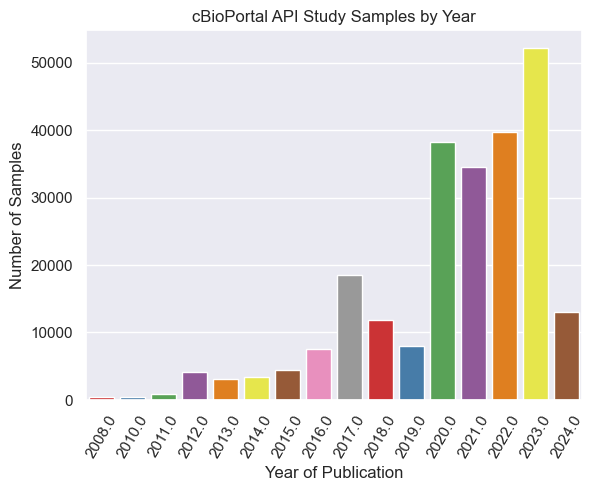

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Plotting the data
p = sns.barplot(
    x='Year of Publication', 
    y='Number of Samples', 
    data = df,  
    palette = 'Set1',
    hue='Year of Publication',
    legend=False,
    errorbar = ('ci', 0))
    
p.set(title='cBioPortal API Study Samples by Year')

p.set_xticks(ticks=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15])
p.set_xticklabels(p.get_xticklabels(), rotation=60) 

sns.axes_style("white")
sns.set_style("darkgrid")

sns.set(font_scale=1)

plt.show()



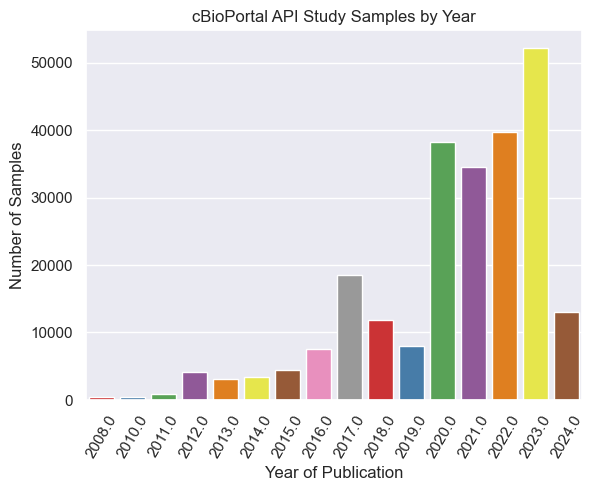

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Plotting the data
p = sns.barplot(
    x='Year of Publication', 
    y='Number of Samples', 
    data = df,  
    palette = 'Set1',
    hue='Year of Publication',
    legend=False,
    errorbar = ('ci', 0))
    
p.set(title='cBioPortal API Study Samples by Year')

p.set_xticks(ticks=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15])
p.set_xticklabels(p.get_xticklabels(), rotation=60) 

sns.axes_style("white")
sns.set_style("darkgrid")

sns.set(font_scale=1)

plt.show()

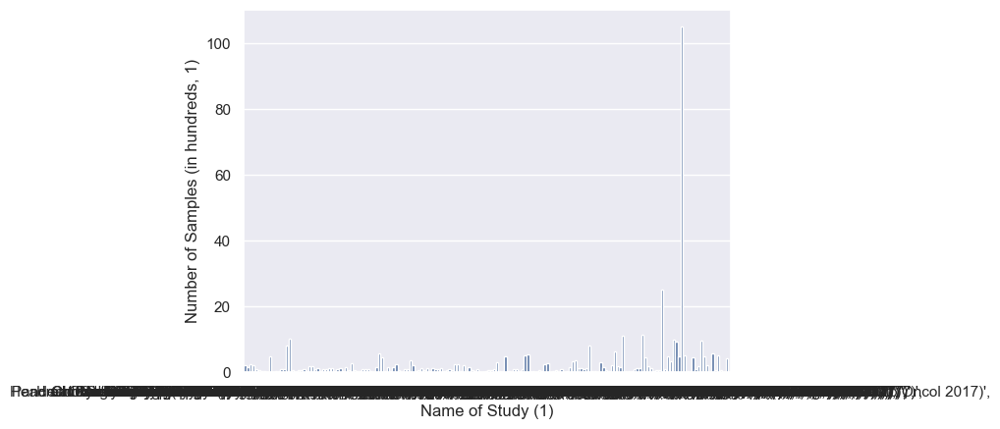

In [ ]:
p = sns.barplot(
    x='Name of Study (1)', 
    y='Number of Samples (in hundreds, 1)', 
    data = df, 
    errorbar = ('ci', 0))

plt.show()

/var/folders/ss/k0lqmw8j49qcd4xkkmsnr20d7682fy/T/ipykernel_2049/1917083804.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  p.set_xticklabels(p.get_xticklabels(), rotation=90)


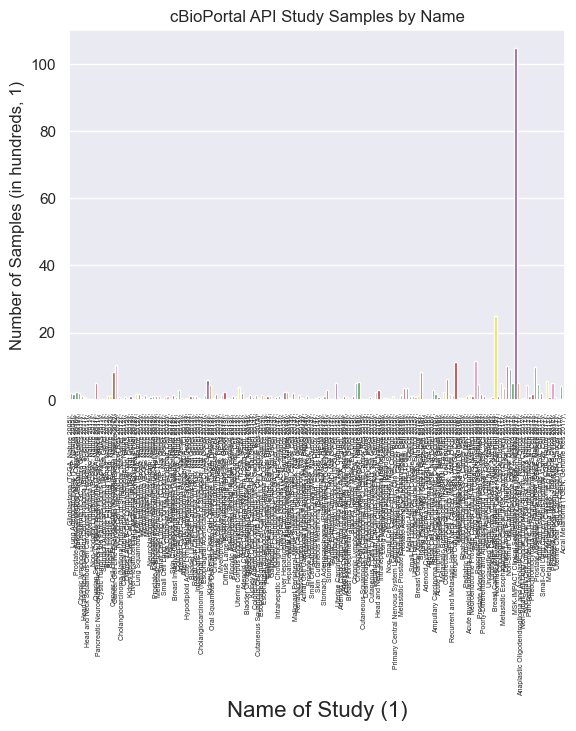

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Plotting the data
p = sns.barplot(
    x='Name of Study (1)', 
    y='Number of Samples (in hundreds, 1)', 
    data = df,  
    palette = 'Set1',
    hue='Name of Study (1)',
    legend=False,
    errorbar = ('ci', 0))
    
p.set(title='cBioPortal API Study Samples by Name')

p.set_xticklabels(p.get_xticklabels(), rotation=90) 
plt.xlabel('Name of Study (1)', fontsize=16)
plt.tick_params(axis='x', which='major', labelsize=5)


sns.axes_style("white")
sns.set_style("darkgrid")
sns.set(font_scale=1)


plt.show()

In [ ]:
print("Update to cbioportal occurred on July 29th, 2024. Will have to create new graphs to showcase new change.")

Update to cbioportal occurred on July 29th, 2024. Will have to create new graphs to showcase new change.


## Graphing Total Samples by Year of Publication

In [ ]:
studies = cbioportal.Studies.getAllStudiesUsingGET().result()
{k:getattr(studies, k) for k in dir(studies)}

{'__add__': <method-wrapper '__add__' of list object at 0x30a61eac0>,
 '__class__': list,
 '__class_getitem__': <function list.__class_getitem__>,
 '__contains__': <method-wrapper '__contains__' of list object at 0x30a61eac0>,
 '__delattr__': <method-wrapper '__delattr__' of list object at 0x30a61eac0>,
 '__delitem__': <method-wrapper '__delitem__' of list object at 0x30a61eac0>,
 '__dir__': <function list.__dir__()>,
 '__doc__': 'Built-in mutable sequence.\n\nIf no argument is given, the constructor creates a new empty list.\nThe argument must be an iterable if specified.',
 '__eq__': <method-wrapper '__eq__' of list object at 0x30a61eac0>,
 '__format__': <function list.__format__(format_spec, /)>,
 '__ge__': <method-wrapper '__ge__' of list object at 0x30a61eac0>,
 '__getattribute__': <method-wrapper '__getattribute__' of list object at 0x30a61eac0>,
 '__getitem__': <function list.__getitem__(index, /)>,
 '__getstate__': <function list.__getstate__()>,
 '__gt__': <method-wrapper '__g

In [ ]:
import pandas as pd

df_new = pd.DataFrame.from_dict([
dict(
    {k:getattr(s,k) for k in dir(s)},
    **{k:getattr(s.studyId,k) for k in dir(s.studyId)})
    for s in studies
])

In [ ]:
df_new.columns

Index(['allSampleCount', 'cancerType', 'cancerTypeId', 'citation',
       'cnaSampleCount', 'completeSampleCount', 'description', 'groups',
       'importDate', 'massSpectrometrySampleCount',
       ...
       'rstrip', 'split', 'splitlines', 'startswith', 'strip', 'swapcase',
       'title', 'translate', 'upper', 'zfill'],
      dtype='object', length=106)

In [ ]:
df_new['name allSampleCount cancerTypeId'.split()].head()

,name,allSampleCount,cancerTypeId
0,"Adenoid Cystic Carcinoma (MSK, Nat Genet 2013)",60,acyc
1,"Adenoid Cystic Carcinoma (FMI, Am J Surg Pathl...",28,acyc
2,"Adenoid Cystic Carcinoma (JHU, Cancer Prev Res...",25,acyc
3,"Adenoid Cystic Carcinoma (MDA, Clin Cancer Res...",102,acyc
4,"Adenoid Cystic Carcinoma (MGH, Nat Gen 2016)",10,acyc


In [ ]:
import numpy as np
import pandas as pd

df_new = pd.DataFrame.from_dict([
    {
        'name': getattr(s, 'name'), 
        'allSampleCount': getattr(s, 'allSampleCount'),
        'cancerTypeId': getattr(s, 'cancerTypeId')
    }
    for s in studies
])
df_new['name allSampleCount cancerTypeId'.split()].head()

# Permanently changes the pandas settings
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)
df_new = df_new[df_new["name"].str.contains('20')]

# All dataframes hereafter reflect these changes.
display(df_new)
df_new['name allSampleCount cancerTypeId'.split()].head()

print('**RESET_OPTIONS**')

# Resets the options
pd.reset_option('all')
display(df_new)

,name,allSampleCount,cancerTypeId
0,"Adenoid Cystic Carcinoma (MSK, Nat Genet 2013)",60,acyc
1,"Adenoid Cystic Carcinoma (FMI, Am J Surg Pathl. 2014)",28,acyc
2,"Adenoid Cystic Carcinoma (JHU, Cancer Prev Res 2016)",25,acyc
3,"Adenoid Cystic Carcinoma (MDA, Clin Cancer Res 2015)",102,acyc
4,"Adenoid Cystic Carcinoma (MGH, Nat Gen 2016)",10,acyc
5,"Adenoid Cystic Carcinoma (Sanger/MDA, JCI 2013)",24,acyc
6,Adenoid Cystic Carcinoma Project (J Clin Invest 2019),1049,acyc
7,"Basal Cell Carcinoma (UNIGE, Nat Genet 2016)",293,bcc
8,"Acute Lymphoblastic Leukemia (St Jude, Nat Genet 2015)",93,bll
9,"Ampullary Carcinoma (Baylor College of Medicine, Cell Reports 2016)",160,ampca


**RESET_OPTIONS**


/var/folders/ss/k0lqmw8j49qcd4xkkmsnr20d7682fy/T/ipykernel_3700/4060532020.py:28: FutureWarning: data_manager option is deprecated and will be removed in a future version. Only the BlockManager will be available.
  pd.reset_option('all')
/var/folders/ss/k0lqmw8j49qcd4xkkmsnr20d7682fy/T/ipykernel_3700/4060532020.py:28: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  pd.reset_option('all')


,name,allSampleCount,cancerTypeId
0,"Adenoid Cystic Carcinoma (MSK, Nat Genet 2013)",60,acyc
1,"Adenoid Cystic Carcinoma (FMI, Am J Surg Pathl...",28,acyc
2,"Adenoid Cystic Carcinoma (JHU, Cancer Prev Res...",25,acyc
3,"Adenoid Cystic Carcinoma (MDA, Clin Cancer Res...",102,acyc
4,"Adenoid Cystic Carcinoma (MGH, Nat Gen 2016)",10,acyc
...,...,...,...
391,Pan-cancer analysis of whole genomes (ICGC/TCG...,2922,mixed
415,"Pancreatic Adenocarcinoma (MSK, 2024)",2336,pancreas
416,"ERBB2-mutant Endometrial cancer (MSK,2024)",69,ucec
460,"Adenoid Cystic Carcinoma of the Breast (MSK, J...",12,acbc


In [ ]:
print("There are {} studies available with an indicated publication year. The other {} are excluded from this graph.".format(
    len(df_new),
    len(studies)-len(df_new)
))

print("There are {} studies total that are available in the cBioPortal API.".format(
    len(studies)
))

There are 350 studies available with an indicated publication year. The other 112 are excluded from this graph.
There are 462 studies total that are available in the cBioPortal API.


/var/folders/ss/k0lqmw8j49qcd4xkkmsnr20d7682fy/T/ipykernel_3700/2433189894.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  p.set_xticklabels(p.get_xticklabels(), rotation=60)


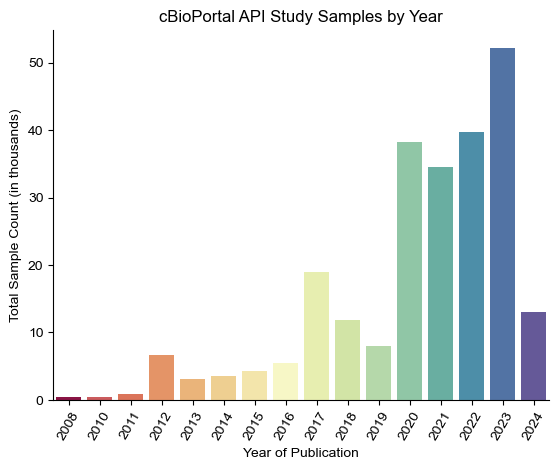

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


df_new = pd.DataFrame.from_dict([
    {
        'name': getattr(s, 'name'), 
        'allSampleCount': getattr(s, 'allSampleCount'),
        'cancerTypeId': getattr(s, 'cancerTypeId')
    }
    for s in studies
])

pd.options.display.float_format = '{:,.2f}'.format
df_new['allSampleCount'] = df_new['allSampleCount'] / 1000

df_new['name allSampleCount cancerTypeId'.split()].head()

df_new = df_new[df_new["name"].str.contains('20')]

df_new['Year'] = df_new['name'].str.extract(r'(\d{4})').astype(int)

df_new = df_new.dropna(subset=['Year'])

samples_per_year = df_new.groupby('Year')['allSampleCount'].sum().reset_index()



p = sns.barplot(
    x='Year', 
    y='allSampleCount', 
    data = samples_per_year,  
    palette = 'Spectral',
    hue='Year',
    legend=False,
    errorbar = ('ci', 0))
    
plt.xlabel('Year of Publication')
p.set_xticklabels(p.get_xticklabels(), rotation=60) 
plt.ylabel('Total Sample Count (in thousands)')
p.set(title='cBioPortal API Study Samples by Year')

sns.set_style("white")
sns.set_context('notebook')
sns.despine(trim=False)

plt.show()


## Graphing Total Number of Studies by Year

In [ ]:
print("There are {} studies available with an indicated publication year. The other {} are excluded from this graph.".format(
    len(df_new),
    len(studies)-len(df_new)
))

print("There are {} studies total that are available in the cBioPortal API.".format(
    len(studies)
))

There are 350 studies available with an indicated publication year. The other 112 are excluded from this graph.
There are 462 studies total that are available in the cBioPortal API.


The following must be updated accordingly by each coming year:

In [ ]:
#Studies in 2008
def search_string(s, search):
    return search in str(s).lower()

mask = df_new.apply(lambda x: x.map(lambda s: search_string(s, '2008')))

df_2008 = df_new.loc[mask.any(axis=1)]
print(df_2008)

#Studies in 2010
def search_string(s, search):
    return search in str(s).lower()

mask = df_new.apply(lambda x: x.map(lambda s: search_string(s, '2010')))

df_2010 = df_new.loc[mask.any(axis=1)]
print(df_2010)

#Studies in 2011
def search_string(s, search):
    return search in str(s).lower()

mask = df_new.apply(lambda x: x.map(lambda s: search_string(s, '2011')))

df_2011 = df_new.loc[mask.any(axis=1)]
print(df_2011)

#Studies in 2012
def search_string(s, search):
    return search in str(s).lower()

mask = df_new.apply(lambda x: x.map(lambda s: search_string(s, '2012')))

df_2012 = df_new.loc[mask.any(axis=1)]
print(df_2012)

#Studies in 2013
def search_string(s, search):
    return search in str(s).lower()

mask = df_new.apply(lambda x: x.map(lambda s: search_string(s, '2013')))

df_2013 = df_new.loc[mask.any(axis=1)]
print(df_2013)

#Studies in 2014
def search_string(s, search):
    return search in str(s).lower()

mask = df_new.apply(lambda x: x.map(lambda s: search_string(s, '2014')))

df_2014 = df_new.loc[mask.any(axis=1)]
print(df_2014)

#Studies in 2015
def search_string(s, search):
    return search in str(s).lower()

mask = df_new.apply(lambda x: x.map(lambda s: search_string(s, '2015')))

df_2015 = df_new.loc[mask.any(axis=1)]
print(df_2015)

#Studies in 2016
def search_string(s, search):
    return search in str(s).lower()

mask = df_new.apply(lambda x: x.map(lambda s: search_string(s, '2016')))

df_2016 = df_new.loc[mask.any(axis=1)]
print(df_2016)

#Studies in 2017
def search_string(s, search):
    return search in str(s).lower()

mask = df_new.apply(lambda x: x.map(lambda s: search_string(s, '2017')))

df_2017 = df_new.loc[mask.any(axis=1)]
print(df_2017)

#Studies in 2018
def search_string(s, search):
    return search in str(s).lower()

mask = df_new.apply(lambda x: x.map(lambda s: search_string(s, '2018')))

df_2018 = df_new.loc[mask.any(axis=1)]
print(df_2018)

#Studies in 2019
def search_string(s, search):
    return search in str(s).lower()

mask = df_new.apply(lambda x: x.map(lambda s: search_string(s, '2019')))

df_2019 = df_new.loc[mask.any(axis=1)]
print(df_2019)

#Studies in 2020
def search_string(s, search):
    return search in str(s).lower()

mask = df_new.apply(lambda x: x.map(lambda s: search_string(s, '2020')))

df_2020 = df_new.loc[mask.any(axis=1)]
print(df_2020)

#Studies in 2021
def search_string(s, search):
    return search in str(s).lower()

mask = df_new.apply(lambda x: x.map(lambda s: search_string(s, '2021')))

df_2021 = df_new.loc[mask.any(axis=1)]
print(df_2021)

#Studies in 2022
def search_string(s, search):
    return search in str(s).lower()

mask = df_new.apply(lambda x: x.map(lambda s: search_string(s, '2022')))

df_2022 = df_new.loc[mask.any(axis=1)]
print(df_2022)

#Studies in 2023
def search_string(s, search):
    return search in str(s).lower()

mask = df_new.apply(lambda x: x.map(lambda s: search_string(s, '2023')))

df_2023 = df_new.loc[mask.any(axis=1)]
print(df_2023)

#Studies in 2024
def search_string(s, search):
    return search in str(s).lower()

mask = df_new.apply(lambda x: x.map(lambda s: search_string(s, '2024')))

df_2024 = df_new.loc[mask.any(axis=1)]
print(df_2024)



                                       name  allSampleCount cancerTypeId  Year
84         Glioblastoma (TCGA, Nature 2008)            0.21          gbm  2008
125  Lung Adenocarcinoma (TSP, Nature 2008)            0.16         luad  2008
                                                name  allSampleCount  \
212  Prostate Adenocarcinoma (MSK, Cancer Cell 2010)            0.24   
230            Sarcoma (MSKCC/Broad, Nat Genet 2010)            0.21   

    cancerTypeId  Year  
212         prad  2010  
230  soft_tissue  2010  
                                                  name  allSampleCount  \
52   Chronic lymphocytic leukemia (ICGC, Nature Gen...            0.10   
109  Head and Neck Squamous Cell Carcinoma (Broad, ...            0.07   
110  Head and Neck Squamous Cell Carcinoma (Johns H...            0.03   
139               Myelodysplasia (UTokyo, Nature 2011)            0.03   
178          Non-Hodgkin Lymphoma (BCGSC, Nature 2011)            0.01   
189  Ovarian Serous Cystade

In [ ]:
sum_of_studies = (len(df_2008),
(len(df_2010)),
(len(df_2011)),
(len(df_2012)),
(len(df_2013)),
(len(df_2014)),
(len(df_2015)),
(len(df_2016)),
(len(df_2017)),
(len(df_2018)),
(len(df_2019)),
(len(df_2020)),
(len(df_2021)),
(len(df_2022)),
(len(df_2023)),
(len(df_2024)))

print(sum_of_studies)

(2, 2, 9, 27, 22, 35, 29, 26, 24, 24, 18, 33, 25, 37, 24, 14)


Luckily, it is really just a copy paste of the template code and changing the year as needed.

The final piece of code requires that you add in the new years:

In [ ]:
import pandas as pd

#Add years following 2024 here:
studies_data = {'Year': [2008, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024],
'Number of Studies': sum_of_studies}

df_studies = pd.DataFrame(studies_data)

print(df_studies)

    Year  Number of Studies
0   2008                  2
1   2010                  2
2   2011                  9
3   2012                 27
4   2013                 22
5   2014                 35
6   2015                 29
7   2016                 26
8   2017                 24
9   2018                 24
10  2019                 18
11  2020                 33
12  2021                 25
13  2022                 37
14  2023                 24
15  2024                 14


/var/folders/ss/k0lqmw8j49qcd4xkkmsnr20d7682fy/T/ipykernel_3700/116173703.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  p.set_xticklabels(p.get_xticklabels(), rotation=60)


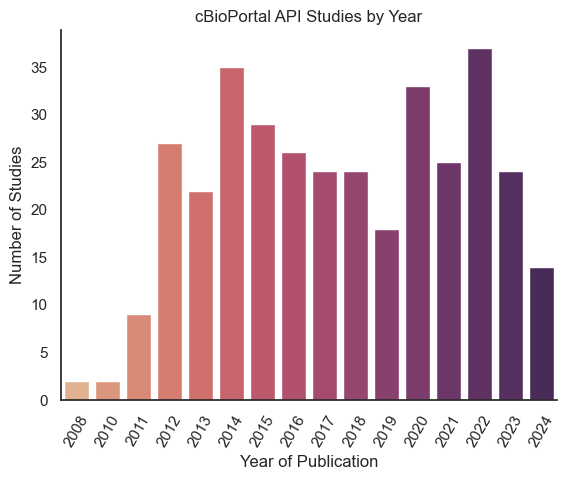

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


studies_data = {'Year': [2008, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024],
'Number of Studies': sum_of_studies}

df_studies = pd.DataFrame(studies_data)

p = sns.barplot(
    x='Year', 
    y='Number of Studies', 
    data = df_studies,  
    palette = 'flare',
    hue='Year',
    legend=False,
    errorbar = ('ci', 0))
    
plt.xlabel('Year of Publication')
p.set_xticklabels(p.get_xticklabels(), rotation=60) 
plt.ylabel('Number of Studies')
p.set(title='cBioPortal API Studies by Year')

sns.set_style("white")
sns.set_context('notebook')
sns.despine(trim=False)

plt.show()


## Graphing Total Number of Samples by Year, and Distinguishing Cancer Types

In [15]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


df_new = pd.DataFrame.from_dict([
    {
        'name': getattr(s, 'name'), 
        'allSampleCount': getattr(s, 'allSampleCount'),
        'cancerTypeId': getattr(s, 'cancerTypeId')
    }
    for s in studies
])

pd.options.display.float_format = '{:,.2f}'.format
df_new['allSampleCount'] = df_new['allSampleCount'] / 1000

df_new['name allSampleCount cancerTypeId'.split()].head()

df_new = df_new[df_new["name"].str.contains('20')]

df_new['Year'] = df_new['name'].str.extract(r'(\d{4})').astype(int)

df_new = df_new.dropna(subset=['Year'])

grouped_data = df_new.groupby(['Year','cancerTypeId'])

samplecount_by_group =  grouped_data['allSampleCount'].sum()
print(samplecount_by_group)

Year  cancerTypeId
2008  gbm            0.21
      luad           0.16
2010  prad           0.24
      soft_tissue    0.21
2011  cllsll         0.10
                     ... 
2024  pcnsl          0.09
      plmeso         0.01
      prostate       2.35
      thyroid        0.19
      ucec           0.07
Name: allSampleCount, Length: 263, dtype: float64


In [16]:
samplecount_by_group = samplecount_by_group.reset_index()
samplecount_by_group['Year allSampleCount cancerTypeId'.split()].head()

# Permanently changes the pandas settings
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)


# All dataframes hereafter reflect these changes.
display(samplecount_by_group)


print('**RESET_OPTIONS**')

# Resets the options
pd.reset_option('all')
display(samplecount_by_group)




,Year,cancerTypeId,allSampleCount
0,2008,gbm,0.21
1,2008,luad,0.16
2,2010,prad,0.24
3,2010,soft_tissue,0.21
4,2011,cllsll,0.10
5,2011,hgsoc,0.49
6,2011,hnsc,0.11
7,2011,mds,0.03
8,2011,nhl,0.01
9,2011,pact,0.03


**RESET_OPTIONS**


/var/folders/ss/k0lqmw8j49qcd4xkkmsnr20d7682fy/T/ipykernel_3489/1379844366.py:18: FutureWarning: data_manager option is deprecated and will be removed in a future version. Only the BlockManager will be available.
  pd.reset_option('all')
/var/folders/ss/k0lqmw8j49qcd4xkkmsnr20d7682fy/T/ipykernel_3489/1379844366.py:18: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  pd.reset_option('all')


,Year,cancerTypeId,allSampleCount
0,2008,gbm,0.206
1,2008,luad,0.163
2,2010,prad,0.240
3,2010,soft_tissue,0.207
4,2011,cllsll,0.105
...,...,...,...
258,2024,pcnsl,0.086
259,2024,plmeso,0.014
260,2024,prostate,2.348
261,2024,thyroid,0.190


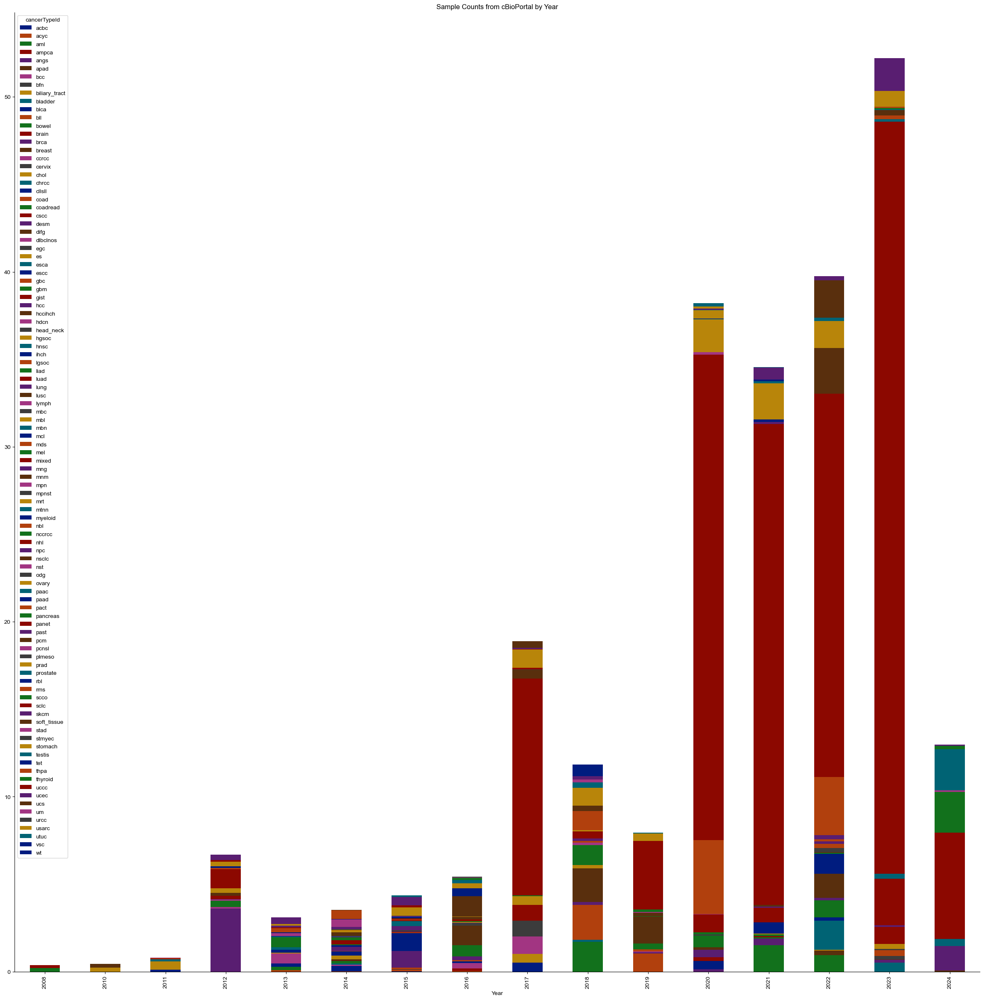

In [17]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

list_colors = sns.color_palette("dark", n_colors=101)

samplecount_by_group['Year allSampleCount cancerTypeId'.split()].head()
   
samplecount_by_group.pivot_table(index='Year', columns='cancerTypeId', values='allSampleCount',
                aggfunc='sum', fill_value=0).plot.bar(stacked=True, legend=True, figsize=(30,30), color=list_colors, title="Sample Counts from cBioPortal by Year")

sns.set_style("white")
sns.set_context('notebook')
sns.despine(trim=False)

plt.show()

Fixing colors to match cancer types:

In [18]:
import pandas as pd
cancer_types = cbioportal.Cancer_Types.getAllCancerTypesUsingGET().result()

df_colors = pd.DataFrame.from_dict([
dict(
    {k:getattr(c,k) for k in dir(c)},
    **{k:getattr(c.dedicatedColor,k) for k in dir(c.dedicatedColor)})
    for c in cancer_types
])

In [19]:
df_colors.columns

Index(['cancerTypeId', 'dedicatedColor', 'name', 'parent', 'shortName',
       '__add__', '__class__', '__contains__', '__delattr__', '__dir__',
       '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__',
       '__getitem__', '__getnewargs__', '__getstate__', '__gt__', '__hash__',
       '__init__', '__init_subclass__', '__iter__', '__le__', '__len__',
       '__lt__', '__mod__', '__mul__', '__ne__', '__new__', '__reduce__',
       '__reduce_ex__', '__repr__', '__rmod__', '__rmul__', '__setattr__',
       '__sizeof__', '__str__', '__subclasshook__', 'capitalize', 'casefold',
       'center', 'count', 'encode', 'endswith', 'expandtabs', 'find', 'format',
       'format_map', 'index', 'isalnum', 'isalpha', 'isascii', 'isdecimal',
       'isdigit', 'isidentifier', 'islower', 'isnumeric', 'isprintable',
       'isspace', 'istitle', 'isupper', 'join', 'ljust', 'lower', 'lstrip',
       'maketrans', 'partition', 'removeprefix', 'removesuffix', 'replace',
       'rfind', 'rindex'

In [20]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


df_new = pd.DataFrame.from_dict([
    {
        'name': getattr(s, 'name'), 
        'allSampleCount': getattr(s, 'allSampleCount'),
        'cancerTypeId': getattr(s, 'cancerTypeId')
    }
    for s in studies
])

pd.options.display.float_format = '{:,.2f}'.format
df_new['allSampleCount'] = df_new['allSampleCount'] / 1000

df_new['name allSampleCount cancerTypeId'.split()].head()

df_new = df_new[df_new["name"].str.contains('20')]

df_new['Year'] = df_new['name'].str.extract(r'(\d{4})').astype(int)

df_new = df_new.dropna(subset=['Year'])

samples_per_year = df_new.groupby('Year')['allSampleCount'].sum().reset_index()

In [21]:
df_colors['dedicatedColor cancerTypeId'.split()].head()

,dedicatedColor,cancerTypeId
0,LightYellow,aa
1,Gray,aastr
2,LimeGreen,abc
3,LightSalmon,abl
4,Purple,aca


In [22]:
color_map = df_colors.set_index('cancerTypeId')['dedicatedColor'].to_dict()
color_map

{'aa': 'LightYellow',
 'aastr': 'Gray',
 'abc': 'LimeGreen',
 'abl': 'LightSalmon',
 'aca': 'Purple',
 'acbc': 'HotPink',
 'acc': 'Purple',
 'accc': 'DarkRed',
 'aclg': 'Green',
 'acml': 'LightSalmon',
 'acn': 'Black',
 'acpg': 'Gray',
 'acpp': 'Gray',
 'acrm': 'Black',
 'acyc': 'DarkRed',
 'adma': 'White',
 'adnos': 'Black',
 'adpa': 'Black',
 'adrenal_gland': 'Purple',
 'aeca': 'Black',
 'afh': 'LightYellow',
 'afx': 'Black',
 'aga': 'SaddleBrown',
 'agng': 'Gray',
 'ahcd': 'LimeGreen',
 'ais': 'Black',
 'aitl': 'LimeGreen',
 'alal': 'LightSalmon',
 'alcl': 'LimeGreen',
 'alclalkn': 'LimeGreen',
 'alclalkp': 'LimeGreen',
 'alklbcl': 'LimeGreen',
 'alt': 'LightYellow',
 'aluca': 'Gainsboro',
 'am': 'LightSalmon',
 'ambl': 'Gray',
 'amblnos': 'Gray',
 'amblnws': 'Gray',
 'amblnwsg3': 'Gray',
 'amblnwsg4': 'Gray',
 'amblshh': 'Gray',
 'amkl': 'LightSalmon',
 'aml': 'LightSalmon',
 'amlbcrabl1': 'LightSalmon',
 'amlcbfbmyh11': 'LightSalmon',
 'amlcebpa': 'LightSalmon',
 'amldeknup214': '

In [23]:
import seaborn as sns
import matplotlib.colors as mcolors

cancer_color_map = {'aa': 'LightYellow',
 'aastr': 'Gray',
 'abc': 'LimeGreen',
 'abl': 'LightSalmon',
 'aca': 'Purple',
 'acbc': 'HotPink',
 'acc': 'Purple',
 'accc': 'DarkRed',
 'aclg': 'Green',
 'acml': 'LightSalmon',
 'acn': 'Black',
 'acpg': 'Gray',
 'acpp': 'Gray',
 'acrm': 'Black',
 'acyc': 'DarkRed',
 'adma': 'White',
 'adnos': 'Black',
 'adpa': 'Black',
 'adrenal_gland': 'Purple',
 'aeca': 'Black',
 'afh': 'LightYellow',
 'afx': 'Black',
 'aga': 'SaddleBrown',
 'agng': 'Gray',
 'ahcd': 'LimeGreen',
 'ais': 'Black',
 'aitl': 'LimeGreen',
 'alal': 'LightSalmon',
 'alcl': 'LimeGreen',
 'alclalkn': 'LimeGreen',
 'alclalkp': 'LimeGreen',
 'alklbcl': 'LimeGreen',
 'alt': 'LightYellow',
 'aluca': 'Gainsboro',
 'am': 'LightSalmon',
 'ambl': 'Gray',
 'amblnos': 'Gray',
 'amblnws': 'Gray',
 'amblnwsg3': 'Gray',
 'amblnwsg4': 'Gray',
 'amblshh': 'Gray',
 'amkl': 'LightSalmon',
 'aml': 'LightSalmon',
 'amlbcrabl1': 'LightSalmon',
 'amlcbfbmyh11': 'LightSalmon',
 'amlcebpa': 'LightSalmon',
 'amldeknup214': 'LightSalmon',
 'amlgata2mecom': 'LightSalmon',
 'amlmd': 'LightSalmon',
 'amlmllt3kmt2a': 'LightSalmon',
 'amlmrc': 'LightSalmon',
 'amlnos': 'LightSalmon',
 'amlnpm1': 'LightSalmon',
 'amlrara': 'LightSalmon',
 'amlrbm15mkl1': 'LightSalmon',
 'amlrga': 'LightSalmon',
 'amlrunx1': 'LightSalmon',
 'amlrunx1runx1t1': 'LightSalmon',
 'amml': 'LightSalmon',
 'amol': 'LightSalmon',
 'ampca': 'Purple',
 'ampulla_of_vater': 'Purple',
 'an': 'Black',
 'angl': 'Gray',
 'angs': 'LightYellow',
 'ankl': 'LimeGreen',
 'anm': 'Gray',
 'ansc': 'SaddleBrown',
 'aoast': 'Gray',
 'aodg': 'Gray',
 'apad': 'SaddleBrown',
 'ape': 'Gray',
 'aplpmlrara': 'LightSalmon',
 'apmf': 'LightSalmon',
 'aptad': 'Gray',
 'apxa': 'Gray',
 'armm': 'SaddleBrown',
 'arms': 'LightYellow',
 'asct': 'DarkRed',
 'asm': 'LightSalmon',
 'asps': 'LightYellow',
 'astb': 'Gray',
 'astr': 'Gray',
 'atll': 'LimeGreen',
 'atm': 'Gray',
 'atrt': 'Gray',
 'aul': 'LightSalmon',
 'awdnet': 'SaddleBrown',
 'awm': 'LightSalmon',
 'ba': 'HotPink',
 'bcac': 'DarkRed',
 'bcc': 'Black',
 'bcca': 'Gray',
 'bccp': 'Cyan',
 'bclu': 'LimeGreen',
 'bec': 'Gray',
 'bfn': 'HotPink',
 'bgct': 'Gray',
 'bialcl': 'LimeGreen',
 'biliary_tract': 'Green',
 'bimt': 'Gray',
 'bl': 'LimeGreen',
 'blad': 'Yellow',
 'bladder': 'Yellow',
 'blca': 'Yellow',
 'blclc': 'Gainsboro',
 'bll': 'LimeGreen',
 'bll11q': 'LimeGreen',
 'bllbcrabl1': 'LimeGreen',
 'bllbcrabl1l': 'LimeGreen',
 'blletv6runx1': 'LimeGreen',
 'bllhyper': 'LimeGreen',
 'bllhypo': 'LimeGreen',
 'blliamp21': 'LimeGreen',
 'bllil3igh': 'LimeGreen',
 'bllkmt2a': 'LimeGreen',
 'bllnos': 'LimeGreen',
 'bllrga': 'LimeGreen',
 'blltcf3pbx1': 'LimeGreen',
 'blpt': 'HotPink',
 'blsc': 'Yellow',
 'bmgct': 'Gray',
 'bmgt': 'Gray',
 'bmt': 'Gray',
 'bnnos': 'HotPink',
 'bone': 'White',
 'bowel': 'SaddleBrown',
 'bpdcn': 'LightSalmon',
 'bpll': 'LimeGreen',
 'bpscc': 'Blue',
 'bpt': 'HotPink',
 'brain': 'Gray',
 'brame': 'HotPink',
 'brca': 'HotPink',
 'brcanos': 'HotPink',
 'brcnos': 'HotPink',
 'breast': 'HotPink',
 'brsrcc': 'HotPink',
 'btbeov': 'LightBlue',
 'btbov': 'LightBlue',
 'btmov': 'LightBlue',
 'btov': 'LightBlue',
 'byst': 'Gray',
 'cabc': 'Teal',
 'cacc': 'Teal',
 'caexpa': 'DarkRed',
 'cais': 'SaddleBrown',
 'ccbov': 'LightBlue',
 'cce': 'Gray',
 'cchdm': 'White',
 'cchm': 'HotPink',
 'cclc': 'Gainsboro',
 'ccm': 'Gray',
 'ccoc': 'DarkRed',
 'ccov': 'LightBlue',
 'ccprc': 'Orange',
 'ccrcc': 'Orange',
 'ccs': 'LightYellow',
 'ccsk': 'Orange',
 'cdrcc': 'Orange',
 'cead': 'Teal',
 'ceais': 'Teal',
 'ceas': 'Teal',
 'cecc': 'Teal',
 'ceen': 'Teal',
 'cegcc': 'Teal',
 'celi': 'Teal',
 'celnos': 'LightSalmon',
 'cemn': 'Teal',
 'cemu': 'Teal',
 'cene': 'Teal',
 'cerms': 'Teal',
 'cervix': 'Teal',
 'cesc': 'Teal',
 'cese': 'Teal',
 'cevg': 'Teal',
 'chbl': 'White',
 'chdm': 'White',
 'chgl': 'Gray',
 'chl': 'LimeGreen',
 'chlptld': 'LimeGreen',
 'chm': 'PeachPuff',
 'chol': 'Green',
 'chom': 'Gray',
 'chos': 'White',
 'chrcc': 'Orange',
 'chs': 'White',
 'cllsll': 'LimeGreen',
 'clnc': 'Gray',
 'clpdnk': 'LimeGreen',
 'cm': 'Green',
 'cmc': 'SaddleBrown',
 'cmcd': 'LightSalmon',
 'cml': 'LightSalmon',
 'cmlbcrabl1': 'LightSalmon',
 'cmml': 'LightSalmon',
 'cmml0': 'LightSalmon',
 'cmml1': 'LightSalmon',
 'cmml2': 'LightSalmon',
 'cmpt': 'Gainsboro',
 'cnc': 'Gray',
 'cnl': 'LightSalmon',
 'coad': 'SaddleBrown',
 'coadread': 'SaddleBrown',
 'com': 'HotPink',
 'cpc': 'Gray',
 'cpp': 'Gray',
 'cpt': 'Gray',
 'cscc': 'Black',
 'cschw': 'Gray',
 'csclc': 'Gainsboro',
 'csnos': 'HotPink',
 'ctaap': 'SaddleBrown',
 'cup': 'Black',
 'cupnos': 'Black',
 'da': 'SaddleBrown',
 'dastr': 'Gray',
 'dcis': 'HotPink',
 'dcs': 'LightYellow',
 'ddchdm': 'White',
 'ddchs': 'White',
 'ddls': 'LightYellow',
 'des': 'LightYellow',
 'desm': 'Black',
 'df': 'Black',
 'dfl': 'LimeGreen',
 'dfsp': 'Black',
 'dia': 'Gray',
 'difg': 'Gray',
 'dig': 'Gray',
 'dipg': 'Gray',
 'dlbclci': 'LimeGreen',
 'dlbclnos': 'LimeGreen',
 'dmbl': 'Gray',
 'dmblnos': 'Gray',
 'dmblshh': 'Gray',
 'dnt': 'Gray',
 'dsrct': 'LightYellow',
 'dstad': 'LightSkyBlue',
 'dte': 'Black',
 'eatl': 'LimeGreen',
 'ebov': 'LightBlue',
 'ebvdlbclnos': 'LimeGreen',
 'ebvmcu': 'LimeGreen',
 'ecad': 'Teal',
 'ecd': 'LightSalmon',
 'egc': 'LightSkyBlue',
 'egct': 'Black',
 'ehae': 'LightYellow',
 'ehch': 'Green',
 'emalt': 'LimeGreen',
 'embc': 'HotPink',
 'embca': 'Red',
 'embt': 'Gray',
 'emchs': 'White',
 'empd': 'Black',
 'empsgc': 'Black',
 'emyoca': 'DarkRed',
 'encg': 'Gray',
 'enkl': 'LimeGreen',
 'eov': 'LightBlue',
 'ep': 'LimeGreen',
 'epdca': 'LightSkyBlue',
 'epis': 'LightYellow',
 'epm': 'Gray',
 'epmt': 'Gray',
 'erms': 'LightYellow',
 'es': 'White',
 'esca': 'LightSkyBlue',
 'escc': 'LightSkyBlue',
 'esmm': 'LightSkyBlue',
 'ess': 'PeachPuff',
 'esst': 'LightYellow',
 'et': 'LightSalmon',
 'etantr': 'Gray',
 'etmf': 'LightSalmon',
 'etpll': 'LimeGreen',
 'ett': 'PeachPuff',
 'evn': 'Gray',
 'eye': 'Green',
 'fa': 'HotPink',
 'fdcs': 'LightYellow',
 'fhptld': 'LimeGreen',
 'fhrcc': 'Orange',
 'fibs': 'LightYellow',
 'fios': 'White',
 'fl': 'LimeGreen',
 'flc': 'MediumSeaGreen',
 'frct': 'LightSalmon',
 'ft': 'LightBlue',
 'ftcl': 'LimeGreen',
 'gb': 'Gray',
 'gbad': 'Green',
 'gbasc': 'Green',
 'gbc': 'Green',
 'gbm': 'Gray',
 'gcb': 'LimeGreen',
 'gccap': 'SaddleBrown',
 'gcemu': 'Teal',
 'gclc': 'Gainsboro',
 'gct': 'Gray',
 'gctb': 'White',
 'gctstm': 'Red',
 'gej': 'LightSkyBlue',
 'ghcd': 'LimeGreen',
 'ginet': 'SaddleBrown',
 'ginetes': 'LightSkyBlue',
 'gist': 'LightYellow',
 'gmn': 'Gray',
 'gn': 'Gray',
 'gnbl': 'Gray',
 'gnc': 'Gray',
 'gng': 'Gray',
 'gnos': 'Gray',
 'grc': 'LightSkyBlue',
 'grct': 'LightBlue',
 'gs': 'LightYellow',
 'gsarc': 'Gray',
 'gtd': 'PeachPuff',
 'hcc': 'MediumSeaGreen',
 'hccihch': 'MediumSeaGreen',
 'hcl': 'LimeGreen',
 'hcl-v': 'LimeGreen',
 'hdcn': 'LightSalmon',
 'hdcs': 'LightYellow',
 'head_neck': 'DarkRed',
 'hema': 'LightYellow',
 'hgbcl': 'LimeGreen',
 'hgbclmycbcl2': 'LimeGreen',
 'hgess': 'PeachPuff',
 'hggnos': 'Gray',
 'hgnec': 'SaddleBrown',
 'hgnee': 'LightSkyBlue',
 'hgnes': 'LightSkyBlue',
 'hgnet': 'Gray',
 'hgonec': 'LightBlue',
 'hgsft': 'LightBlue',
 'hgsoc': 'LightBlue',
 'hgsos': 'White',
 'hhv8dlbcl': 'LimeGreen',
 'hl': 'LimeGreen',
 'hmbl': 'Gray',
 'hnmasc': 'DarkRed',
 'hnmucm': 'DarkRed',
 'hnne': 'DarkRed',
 'hnsc': 'DarkRed',
 'hnscup': 'DarkRed',
 'hpccns': 'Gray',
 'hphsc': 'DarkRed',
 'hs': 'LightSalmon',
 'hstcl': 'LimeGreen',
 'htat': 'Teal',
 'hvll': 'LimeGreen',
 'iampca': 'Purple',
 'ibc': 'HotPink',
 'icemu': 'Teal',
 'icpn': 'Green',
 'idc': 'HotPink',
 'idcs': 'LightYellow',
 'idct': 'LightSalmon',
 'ifs': 'LightYellow',
 'ihch': 'Green',
 'ihm': 'PeachPuff',
 'ilc': 'HotPink',
 'immc': 'HotPink',
 'imptld': 'LimeGreen',
 'ims': 'LightYellow',
 'imt': 'LightYellow',
 'imtb': 'Yellow',
 'imtl': 'Gainsboro',
 'ints': 'LightYellow',
 'iopn': 'Purple',
 'ipmn': 'Purple',
 'ipn': 'Green',
 'isfn': 'LimeGreen',
 'ism': 'LightSalmon',
 'ismcl': 'LimeGreen',
 'istad': 'LightSkyBlue',
 'itlpdgi': 'LimeGreen',
 'itpn': 'Purple',
 'iup': 'Yellow',
 'ivbcl': 'LimeGreen',
 'jmml': 'LightSalmon',
 'jscb': 'HotPink',
 'jxg': 'LightSalmon',
 'kidney': 'Orange',
 'lais': 'Gainsboro',
 'lam': 'Gainsboro',
 'lamn': 'SaddleBrown',
 'latl': 'LimeGreen',
 'lbgn': 'LimeGreen',
 'lblirf4': 'LimeGreen',
 'lch': 'LightSalmon',
 'lcis': 'HotPink',
 'lclc': 'Gainsboro',
 'lcs': 'LightSalmon',
 'ldchl': 'LimeGreen',
 'ldd': 'Gray',
 'leclc': 'Gainsboro',
 'lgcos': 'White',
 'lgess': 'PeachPuff',
 'lgfms': 'LightYellow',
 'lggnos': 'Gray',
 'lgnet': 'Gray',
 'lgsoc': 'LightBlue',
 'lgt': 'Green',
 'liad': 'MediumSeaGreen',
 'lias': 'MediumSeaGreen',
 'lihb': 'MediumSeaGreen',
 'limnet': 'MediumSeaGreen',
 'lipo': 'LightYellow',
 'liver': 'MediumSeaGreen',
 'lm': 'LightYellow',
 'lms': 'LightYellow',
 'lnet': 'Gainsboro',
 'lnm': 'LimeGreen',
 'lpl': 'LimeGreen',
 'lrchl': 'LimeGreen',
 'luacc': 'Gainsboro',
 'luad': 'Gainsboro',
 'luas': 'Gainsboro',
 'luca': 'Gainsboro',
 'lumec': 'Gainsboro',
 'lune': 'Gainsboro',
 'lung': 'Gainsboro',
 'lupc': 'Gainsboro',
 'lusc': 'Gainsboro',
 'lxsc': 'DarkRed',
 'lyg': 'LimeGreen',
 'lymph': 'LimeGreen',
 'lyp': 'LimeGreen',
 'maap': 'SaddleBrown',
 'mac': 'Black',
 'macr': 'SaddleBrown',
 'mampca': 'Purple',
 'masc': 'HotPink',
 'mascc': 'HotPink',
 'matpl': 'LightSalmon',
 'mbc': 'HotPink',
 'mben': 'Gray',
 'mbennos': 'Gray',
 'mbenshh': 'Gray',
 'mbgn': 'LightSalmon',
 'mbl': 'Gray',
 'mblg3': 'Gray',
 'mblg4': 'Gray',
 'mblnos': 'Gray',
 'mblnws': 'Gray',
 'mblshh': 'Gray',
 'mblwnt': 'Gray',
 'mbn': 'LimeGreen',
 'mbov': 'LightBlue',
 'mbt': 'Gray',
 'mcbcl': 'LimeGreen',
 'mcc': 'Black',
 'mcce': 'Teal',
 'mcchl': 'LimeGreen',
 'mcd': 'LightSalmon',
 'mchs': 'White',
 'mchscns': 'Gray',
 'mcl': 'LimeGreen',
 'mcn': 'Purple',
 'mcs': 'HotPink',
 'mcsl': 'LightSalmon',
 'mdep': 'Gray',
 'mdlc': 'HotPink',
 'mds': 'LightSalmon',
 'mds/mpn': 'LightSalmon',
 'mdseb': 'LightSalmon',
 'mdseb1': 'LightSalmon',
 'mdseb2': 'LightSalmon',
 'mdsid5q': 'LightSalmon',
 'mdsmd': 'LightSalmon',
 'mdsmpnrst': 'LightSalmon',
 'mdsmpnu': 'LightSalmon',
 'mdsrs': 'LightSalmon',
 'mdsrsmd': 'LightSalmon',
 'mdsrssld': 'LightSalmon',
 'mdssld': 'LightSalmon',
 'mdsu': 'LightSalmon',
 'meitl': 'LimeGreen',
 'mel': 'Black',
 'melc': 'Gray',
 'mf': 'LightYellow',
 'mfh': 'LightYellow',
 'mfs': 'LightYellow',
 'mgct': 'Red',
 'mgst': 'LightYellow',
 'mgus': 'LimeGreen',
 'mgusiga': 'LimeGreen',
 'mgusigg': 'LimeGreen',
 'mgusigm': 'LimeGreen',
 'mhcd': 'LimeGreen',
 'midd': 'LimeGreen',
 'midda': 'LimeGreen',
 'middo': 'LimeGreen',
 'mixed': 'Black',
 'mlads': 'LightSalmon',
 'mlner': 'LightSalmon',
 'mlnfgfr1': 'LightSalmon',
 'mlnpcm1jak2': 'LightSalmon',
 'mlnpdgfra': 'LightSalmon',
 'mlnpdgfrb': 'LightSalmon',
 'mlym': 'Gray',
 'mmb': 'Gray',
 'mmbc': 'HotPink',
 'mmbl': 'Gray',
 'mnet': 'Gray',
 'mng': 'Gray',
 'mnglp': 'LightSalmon',
 'mngt': 'Gray',
 'mnm': 'LightSalmon',
 'mov': 'LightBlue',
 'mp': 'PeachPuff',
 'mpalbcrabl1': 'LightSalmon',
 'mpalbnos': 'LightSalmon',
 'mpalkmt2a': 'LightSalmon',
 'mpaltnos': 'LightSalmon',
 'mpc': 'LightYellow',
 'mpe': 'Gray',
 'mpn': 'LightSalmon',
 'mpnst': 'Gray',
 'mpnu': 'LightSalmon',
 'mprds': 'LightSalmon',
 'mpt': 'HotPink',
 'mptld': 'LimeGreen',
 'mrc': 'Orange',
 'mrls': 'LightYellow',
 'mrt': 'Orange',
 'mrtl': 'MediumSeaGreen',
 'ms': 'LightSalmon',
 'mscc': 'HotPink',
 'mschw': 'Gray',
 'mstad': 'LightSkyBlue',
 'mt': 'Gray',
 'mtnn': 'LimeGreen',
 'mtscc': 'Orange',
 'mucc': 'DarkRed',
 'mup': 'Black',
 'mxov': 'LightBlue',
 'mycf': 'LimeGreen',
 'mychs': 'White',
 'myec': 'DarkRed',
 'myeloid': 'LightSalmon',
 'myxo': 'LightYellow',
 'mzl': 'LimeGreen',
 'nbl': 'Gray',
 'nccrcc': 'Orange',
 'necnos': 'Black',
 'netnos': 'Black',
 'nfib': 'Gray',
 'nhl': 'LimeGreen',
 'nkcll': 'LimeGreen',
 'nlphl': 'LimeGreen',
 'nmchn': 'DarkRed',
 'nmzl': 'LimeGreen',
 'npc': 'DarkRed',
 'nptltfh': 'LimeGreen',
 'nschl': 'LimeGreen',
 'nsclc': 'Gainsboro',
 'nsclcpd': 'Gainsboro',
 'nsgct': 'Red',
 'nst': 'Gray',
 'nutcl': 'Gainsboro',
 'oast': 'Gray',
 'oat': 'Teal',
 'ocnos': 'LightBlue',
 'ocs': 'LightBlue',
 'ocsc': 'DarkRed',
 'odg': 'Gray',
 'odgc': 'DarkRed',
 'odys': 'LightBlue',
 'oec': 'LightBlue',
 'ofmt': 'LightYellow',
 'ogbl': 'LightBlue',
 'ogct': 'LightBlue',
 'ohnca': 'DarkRed',
 'oimt': 'LightBlue',
 'om': 'Green',
 'omgct': 'LightBlue',
 'omt': 'LightBlue',
 'onbl': 'Gray',
 'oovc': 'LightBlue',
 'ope': 'LightBlue',
 'ophsc': 'DarkRed',
 'os': 'White',
 'osaca': 'DarkRed',
 'osgct': 'Purple',
 'osmad': 'LightBlue',
 'osmbt': 'LightBlue',
 'osmca': 'LightBlue',
 'osos': 'White',
 'other': 'Black',
 'ousarc': 'PeachPuff',
 'outt': 'PeachPuff',
 'ovary': 'LightBlue',
 'ovt': 'LightBlue',
 'oyst': 'LightBlue',
 'paac': 'Purple',
 'paad': 'Purple',
 'paasc': 'Purple',
 'pac': 'DarkRed',
 'pact': 'Purple',
 'pada': 'DarkRed',
 'pampca': 'Purple',
 'pancreas': 'Purple',
 'panec': 'Purple',
 'panet': 'Purple',
 'paos': 'White',
 'past': 'Gray',
 'pb': 'Purple',
 'pbl': 'Gray',
 'pbs': 'HotPink',
 'pbt': 'Gray',
 'pcaectcl': 'LimeGreen',
 'pcalcl': 'LimeGreen',
 'pcatcl': 'LimeGreen',
 'pcfcl': 'LimeGreen',
 'pcgdtcl': 'LimeGreen',
 'pcgp': 'Gray',
 'pclbcllt': 'LimeGreen',
 'pclpd': 'LimeGreen',
 'pcm': 'LimeGreen',
 'pcnsl': 'LimeGreen',
 'pcnsm': 'LightSkyBlue',
 'pcnsmt': 'Gray',
 'pcsmtpld': 'LimeGreen',
 'pd': 'HotPink',
 'pdc': 'Black',
 'pecoma': 'LightYellow',
 'pel': 'LimeGreen',
 'pemeso': 'Green',
 'penis': 'Blue',
 'peos': 'White',
 'peritoneum': 'Green',
 'perl': 'LightSalmon',
 'pgng': 'Gray',
 'pgnt': 'Gray',
 'phc': 'Purple',
 'phch': 'Green',
 'phm': 'PeachPuff',
 'phptld': 'LimeGreen',
 'pinc': 'Gray',
 'pint': 'Gray',
 'plbl': 'LimeGreen',
 'plbmeso': 'Blue',
 'plemeso': 'Blue',
 'pleura': 'Blue',
 'plls': 'LightYellow',
 'plmeso': 'Blue',
 'plrms': 'LightYellow',
 'plsmeso': 'Blue',
 'pma': 'Gray',
 'pmbl': 'LimeGreen',
 'pmf': 'LightSalmon',
 'pmfofs': 'LightSalmon',
 'pmfpes': 'LightSalmon',
 'pmhe': 'LightYellow',
 'pnet': 'Gray',
 'pns': 'Gray',
 'poca': 'Black',
 'poro': 'Black',
 'ppb': 'Gainsboro',
 'ppct': 'Black',
 'ppm': 'Gray',
 'pptid': 'Gray',
 'pptld': 'LimeGreen',
 'prad': 'Cyan',
 'prcc': 'Orange',
 'prne': 'Cyan',
 'prnet': 'Gray',
 'prostate': 'Cyan',
 'prsc': 'Cyan',
 'prscc': 'Cyan',
 'psc': 'Purple',
 'pscc': 'Blue',
 'psec': 'Green',
 'pstad': 'LightSkyBlue',
 'pstt': 'PeachPuff',
 'pt': 'HotPink',
 'ptad': 'Gray',
 'ptca': 'Gray',
 'ptcl': 'LimeGreen',
 'ptcy': 'Gray',
 'ptes': 'LightYellow',
 'ptfl': 'LimeGreen',
 'pth': 'DarkRed',
 'pthc': 'DarkRed',
 'ptld': 'LimeGreen',
 'ptpr': 'Gray',
 'pv': 'LightSalmon',
 'pvmf': 'LightSalmon',
 'pxa': 'Gray',
 'raml': 'Orange',
 'ras': 'LightYellow',
 'rbl': 'Green',
 'rcc': 'Orange',
 'rcsnos': 'LightYellow',
 'rcyc': 'LightSalmon',
 'rdd': 'LightSalmon',
 'read': 'SaddleBrown',
 'rgnt': 'Gray',
 'rhm': 'Gray',
 'rlclc': 'Gainsboro',
 'rms': 'LightYellow',
 'rnet': 'Orange',
 'rocy': 'Orange',
 'rscc': 'Orange',
 'rwdnet': 'SaddleBrown',
 'saad': 'DarkRed',
 'saca': 'DarkRed',
 'sarcl': 'Gainsboro',
 'sarcnos': 'LightYellow',
 'sbc': 'SaddleBrown',
 'sbl': 'DarkRed',
 'sblu': 'LimeGreen',
 'sbmov': 'LightBlue',
 'sbov': 'LightBlue',
 'sbwdnet': 'SaddleBrown',
 'scb': 'Yellow',
 'scbc': 'Yellow',
 'scce': 'Teal',
 'sccnos': 'Black',
 'scco': 'LightBlue',
 'sccrcc': 'Orange',
 'scemu': 'Teal',
 'scgbc': 'Green',
 'scgbm': 'Gray',
 'schw': 'Gray',
 'sclc': 'Gainsboro',
 'sclg': 'Green',
 'scoah': 'Gray',
 'scos': 'White',
 'scrms': 'LightYellow',
 'scsrms': 'LightYellow',
 'scst': 'LightBlue',
 'sct': 'LightBlue',
 'scup': 'Black',
 'sdca': 'DarkRed',
 'sdrpl': 'LimeGreen',
 'seba': 'Black',
 'sebvtlc': 'LimeGreen',
 'secos': 'White',
 'sef': 'LightYellow',
 'selt': 'Gray',
 'sem': 'Red',
 'sft': 'LightYellow',
 'sftcns': 'Gray',
 'sgad': 'Black',
 'sgo': 'DarkRed',
 'sgttl': 'Gainsboro',
 'sic': 'SaddleBrown',
 'skac': 'Black',
 'skcm': 'Black',
 'skcn': 'Black',
 'skin': 'Black',
 'sklmm': 'Black',
 'slct': 'LightBlue',
 'sm': 'LightSalmon',
 'smahn': 'LightSalmon',
 'smmcl': 'LightSalmon',
 'smn': 'LightSkyBlue',
 'smzl': 'LimeGreen',
 'sna': 'DarkRed',
 'snsc': 'DarkRed',
 'snuc': 'DarkRed',
 'soc': 'LightBlue',
 'soft_tissue': 'LightYellow',
 'spb': 'LimeGreen',
 'spc': 'HotPink',
 'spcc': 'Gainsboro',
 'spdac': 'LightSkyBlue',
 'spir': 'Black',
 'spn': 'Purple',
 'sptcl': 'LimeGreen',
 'spzm': 'Black',
 'srap': 'SaddleBrown',
 'srcbc': 'Yellow',
 'srcc': 'Orange',
 'srccr': 'SaddleBrown',
 'ss': 'LimeGreen',
 'ssm': 'LightSalmon',
 'ssrcc': 'LightSkyBlue',
 'stad': 'LightSkyBlue',
 'stas': 'LightSkyBlue',
 'stmyec': 'LightYellow',
 'stomach': 'LightSkyBlue',
 'stsc': 'LightSkyBlue',
 'sube': 'Gray',
 'swdnet': 'LightSkyBlue',
 'syns': 'LightYellow',
 'tac': 'SaddleBrown',
 'tam': 'LightSalmon',
 'taml': 'LightSalmon',
 'tcca': 'Red',
 'teos': 'White',
 'testis': 'Red',
 'tet': 'Purple',
 'tgct': 'LightYellow',
 'thap': 'Teal',
 'thfo': 'Teal',
 'thhc': 'Teal',
 'thme': 'Teal',
 'thpa': 'Teal',
 'thpd': 'Teal',
 'thrlbcl': 'LimeGreen',
 'thyc': 'Purple',
 'thym': 'Purple',
 'thymus': 'Purple',
 'thyroid': 'Teal',
 'tlgl': 'LimeGreen',
 'tll': 'LimeGreen',
 'tlym': 'Red',
 'tmds': 'LightSalmon',
 'tmeso': 'Red',
 'tmn': 'LightSalmon',
 'tnet': 'Purple',
 'tpll': 'LimeGreen',
 'trcc': 'Orange',
 'tscst': 'Red',
 'tstad': 'LightSkyBlue',
 'tt': 'Red',
 'tyst': 'Red',
 'ua': 'Yellow',
 'uad': 'Yellow',
 'uas': 'PeachPuff',
 'uasc': 'PeachPuff',
 'uca': 'Yellow',
 'ucca': 'PeachPuff',
 'uccc': 'PeachPuff',
 'ucec': 'PeachPuff',
 'ucp': 'Purple',
 'ucs': 'PeachPuff',
 'ucu': 'Yellow',
 'uddc': 'PeachPuff',
 'udmn': 'Black',
 'uec': 'PeachPuff',
 'uelms': 'PeachPuff',
 'uesl': 'MediumSeaGreen',
 'ulm': 'PeachPuff',
 'ulms': 'PeachPuff',
 'um': 'Green',
 'umc': 'PeachPuff',
 'umec': 'PeachPuff',
 'umlms': 'PeachPuff',
 'umnc': 'PeachPuff',
 'unec': 'PeachPuff',
 'upa': 'Yellow',
 'updc': 'PeachPuff',
 'upecoma': 'PeachPuff',
 'urca': 'Yellow',
 'urcc': 'Orange',
 'urmm': 'Yellow',
 'usarc': 'PeachPuff',
 'usc': 'PeachPuff',
 'uscc': 'Yellow',
 'usmt': 'PeachPuff',
 'ustad': 'LightSkyBlue',
 'ustump': 'PeachPuff',
 'uterus': 'PeachPuff',
 'utuc': 'Yellow',
 'uuc': 'PeachPuff',
 'uus': 'PeachPuff',
 'va': 'Purple',
 'vdys': 'Purple',
 'vgce': 'Teal',
 'vgct': 'Purple',
 'vimt': 'Purple',
 'vma': 'Purple',
 'vmgct': 'Purple',
 'vmm': 'Purple',
 'vmt': 'Purple',
 'voec': 'Purple',
 'vpdc': 'Purple',
 'vpe': 'Purple',
 'vpscc': 'Blue',
 'vsc': 'Purple',
 'vulva': 'Purple',
 'vyst': 'Purple',
 'wdls': 'LightYellow',
 'wdtc': 'Teal',
 'wm': 'LimeGreen',
 'wpscc': 'Blue',
 'wt': 'Orange'}


cancer_palette = sns.color_palette(list(cancer_color_map.values()))

sns.set_palette(cancer_palette)



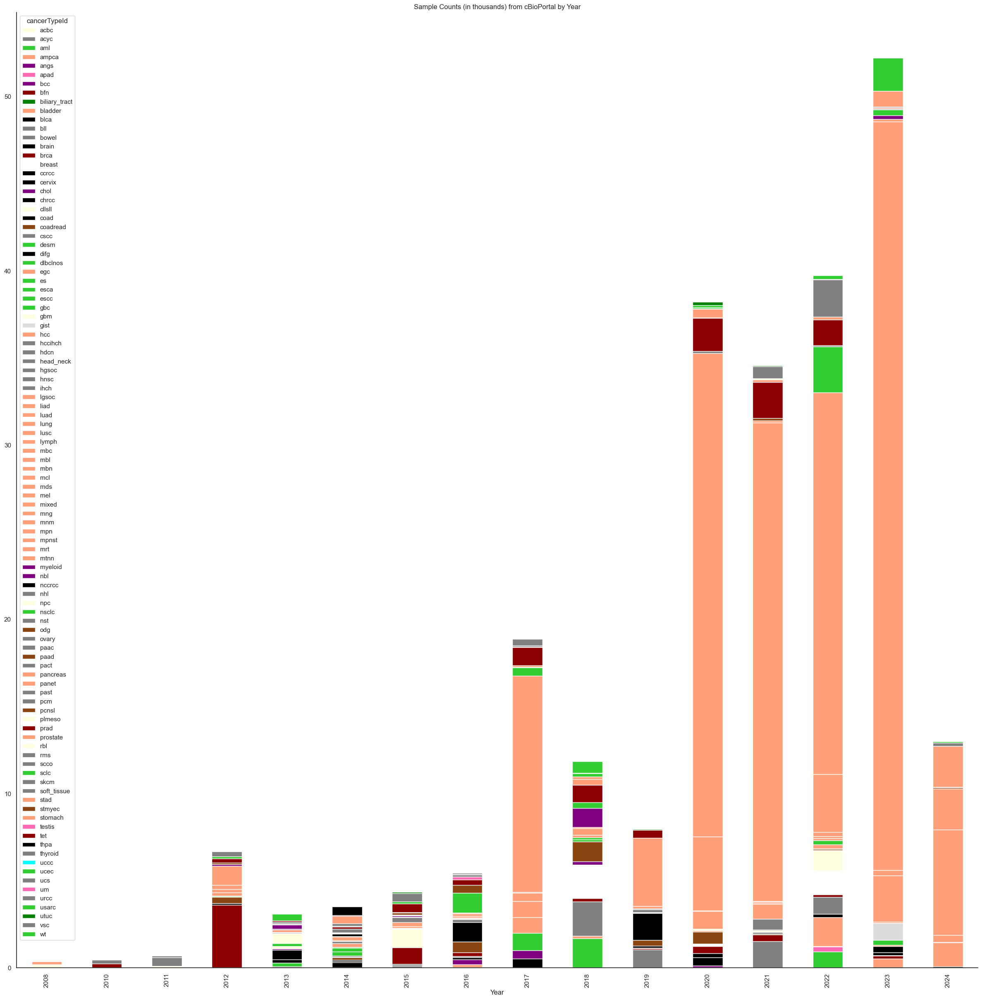

In [24]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

samplecount_by_group['Year allSampleCount cancerTypeId'.split()].head()
   
samplecount_by_group.pivot_table(index='Year', columns='cancerTypeId', values='allSampleCount',
                aggfunc='sum', fill_value=0).plot.bar(stacked=True, legend=True, figsize=(30,30), color=cancer_palette, title="Sample Counts (in thousands) from cBioPortal by Year")

sns.set_style("white")
sns.set_context('notebook')
sns.despine(trim=False)

plt.show()

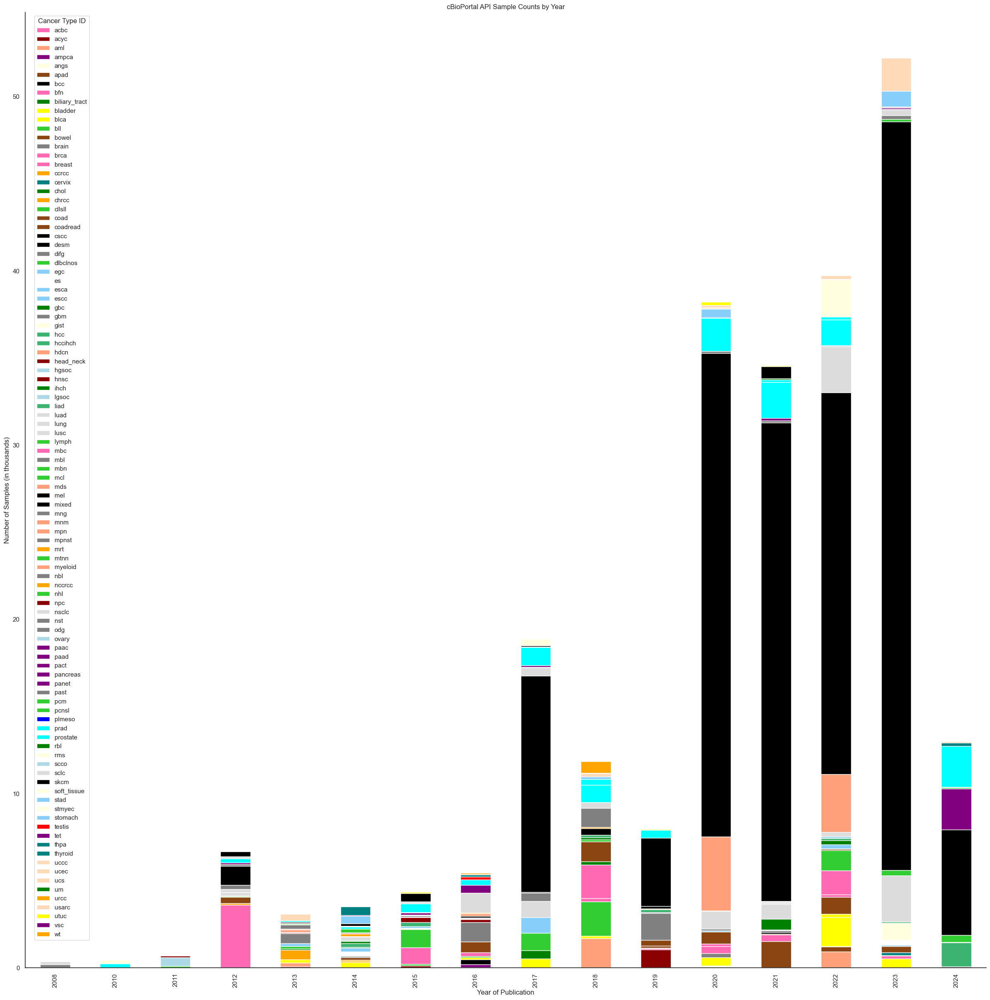

In [25]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

samplecount_by_group['Year allSampleCount cancerTypeId'.split()].head()

data_pivot = samplecount_by_group.pivot(index='Year', columns='cancerTypeId', values='allSampleCount').fillna(0)

cancer_color_map = {'aa': 'LightYellow',
 'aastr': 'Gray',
 'abc': 'LimeGreen',
 'abl': 'LightSalmon',
 'aca': 'Purple',
 'acbc': 'HotPink',
 'acc': 'Purple',
 'accc': 'DarkRed',
 'aclg': 'Green',
 'acml': 'LightSalmon',
 'acn': 'Black',
 'acpg': 'Gray',
 'acpp': 'Gray',
 'acrm': 'Black',
 'acyc': 'DarkRed',
 'adma': 'White',
 'adnos': 'Black',
 'adpa': 'Black',
 'adrenal_gland': 'Purple',
 'aeca': 'Black',
 'afh': 'LightYellow',
 'afx': 'Black',
 'aga': 'SaddleBrown',
 'agng': 'Gray',
 'ahcd': 'LimeGreen',
 'ais': 'Black',
 'aitl': 'LimeGreen',
 'alal': 'LightSalmon',
 'alcl': 'LimeGreen',
 'alclalkn': 'LimeGreen',
 'alclalkp': 'LimeGreen',
 'alklbcl': 'LimeGreen',
 'alt': 'LightYellow',
 'aluca': 'Gainsboro',
 'am': 'LightSalmon',
 'ambl': 'Gray',
 'amblnos': 'Gray',
 'amblnws': 'Gray',
 'amblnwsg3': 'Gray',
 'amblnwsg4': 'Gray',
 'amblshh': 'Gray',
 'amkl': 'LightSalmon',
 'aml': 'LightSalmon',
 'amlbcrabl1': 'LightSalmon',
 'amlcbfbmyh11': 'LightSalmon',
 'amlcebpa': 'LightSalmon',
 'amldeknup214': 'LightSalmon',
 'amlgata2mecom': 'LightSalmon',
 'amlmd': 'LightSalmon',
 'amlmllt3kmt2a': 'LightSalmon',
 'amlmrc': 'LightSalmon',
 'amlnos': 'LightSalmon',
 'amlnpm1': 'LightSalmon',
 'amlrara': 'LightSalmon',
 'amlrbm15mkl1': 'LightSalmon',
 'amlrga': 'LightSalmon',
 'amlrunx1': 'LightSalmon',
 'amlrunx1runx1t1': 'LightSalmon',
 'amml': 'LightSalmon',
 'amol': 'LightSalmon',
 'ampca': 'Purple',
 'ampulla_of_vater': 'Purple',
 'an': 'Black',
 'angl': 'Gray',
 'angs': 'LightYellow',
 'ankl': 'LimeGreen',
 'anm': 'Gray',
 'ansc': 'SaddleBrown',
 'aoast': 'Gray',
 'aodg': 'Gray',
 'apad': 'SaddleBrown',
 'ape': 'Gray',
 'aplpmlrara': 'LightSalmon',
 'apmf': 'LightSalmon',
 'aptad': 'Gray',
 'apxa': 'Gray',
 'armm': 'SaddleBrown',
 'arms': 'LightYellow',
 'asct': 'DarkRed',
 'asm': 'LightSalmon',
 'asps': 'LightYellow',
 'astb': 'Gray',
 'astr': 'Gray',
 'atll': 'LimeGreen',
 'atm': 'Gray',
 'atrt': 'Gray',
 'aul': 'LightSalmon',
 'awdnet': 'SaddleBrown',
 'awm': 'LightSalmon',
 'ba': 'HotPink',
 'bcac': 'DarkRed',
 'bcc': 'Black',
 'bcca': 'Gray',
 'bccp': 'Cyan',
 'bclu': 'LimeGreen',
 'bec': 'Gray',
 'bfn': 'HotPink',
 'bgct': 'Gray',
 'bialcl': 'LimeGreen',
 'biliary_tract': 'Green',
 'bimt': 'Gray',
 'bl': 'LimeGreen',
 'blad': 'Yellow',
 'bladder': 'Yellow',
 'blca': 'Yellow',
 'blclc': 'Gainsboro',
 'bll': 'LimeGreen',
 'bll11q': 'LimeGreen',
 'bllbcrabl1': 'LimeGreen',
 'bllbcrabl1l': 'LimeGreen',
 'blletv6runx1': 'LimeGreen',
 'bllhyper': 'LimeGreen',
 'bllhypo': 'LimeGreen',
 'blliamp21': 'LimeGreen',
 'bllil3igh': 'LimeGreen',
 'bllkmt2a': 'LimeGreen',
 'bllnos': 'LimeGreen',
 'bllrga': 'LimeGreen',
 'blltcf3pbx1': 'LimeGreen',
 'blpt': 'HotPink',
 'blsc': 'Yellow',
 'bmgct': 'Gray',
 'bmgt': 'Gray',
 'bmt': 'Gray',
 'bnnos': 'HotPink',
 'bone': 'White',
 'bowel': 'SaddleBrown',
 'bpdcn': 'LightSalmon',
 'bpll': 'LimeGreen',
 'bpscc': 'Blue',
 'bpt': 'HotPink',
 'brain': 'Gray',
 'brame': 'HotPink',
 'brca': 'HotPink',
 'brcanos': 'HotPink',
 'brcnos': 'HotPink',
 'breast': 'HotPink',
 'brsrcc': 'HotPink',
 'btbeov': 'LightBlue',
 'btbov': 'LightBlue',
 'btmov': 'LightBlue',
 'btov': 'LightBlue',
 'byst': 'Gray',
 'cabc': 'Teal',
 'cacc': 'Teal',
 'caexpa': 'DarkRed',
 'cais': 'SaddleBrown',
 'ccbov': 'LightBlue',
 'cce': 'Gray',
 'cchdm': 'White',
 'cchm': 'HotPink',
 'cclc': 'Gainsboro',
 'ccm': 'Gray',
 'ccoc': 'DarkRed',
 'ccov': 'LightBlue',
 'ccprc': 'Orange',
 'ccrcc': 'Orange',
 'ccs': 'LightYellow',
 'ccsk': 'Orange',
 'cdrcc': 'Orange',
 'cead': 'Teal',
 'ceais': 'Teal',
 'ceas': 'Teal',
 'cecc': 'Teal',
 'ceen': 'Teal',
 'cegcc': 'Teal',
 'celi': 'Teal',
 'celnos': 'LightSalmon',
 'cemn': 'Teal',
 'cemu': 'Teal',
 'cene': 'Teal',
 'cerms': 'Teal',
 'cervix': 'Teal',
 'cesc': 'Teal',
 'cese': 'Teal',
 'cevg': 'Teal',
 'chbl': 'White',
 'chdm': 'White',
 'chgl': 'Gray',
 'chl': 'LimeGreen',
 'chlptld': 'LimeGreen',
 'chm': 'PeachPuff',
 'chol': 'Green',
 'chom': 'Gray',
 'chos': 'White',
 'chrcc': 'Orange',
 'chs': 'White',
 'cllsll': 'LimeGreen',
 'clnc': 'Gray',
 'clpdnk': 'LimeGreen',
 'cm': 'Green',
 'cmc': 'SaddleBrown',
 'cmcd': 'LightSalmon',
 'cml': 'LightSalmon',
 'cmlbcrabl1': 'LightSalmon',
 'cmml': 'LightSalmon',
 'cmml0': 'LightSalmon',
 'cmml1': 'LightSalmon',
 'cmml2': 'LightSalmon',
 'cmpt': 'Gainsboro',
 'cnc': 'Gray',
 'cnl': 'LightSalmon',
 'coad': 'SaddleBrown',
 'coadread': 'SaddleBrown',
 'com': 'HotPink',
 'cpc': 'Gray',
 'cpp': 'Gray',
 'cpt': 'Gray',
 'cscc': 'Black',
 'cschw': 'Gray',
 'csclc': 'Gainsboro',
 'csnos': 'HotPink',
 'ctaap': 'SaddleBrown',
 'cup': 'Black',
 'cupnos': 'Black',
 'da': 'SaddleBrown',
 'dastr': 'Gray',
 'dcis': 'HotPink',
 'dcs': 'LightYellow',
 'ddchdm': 'White',
 'ddchs': 'White',
 'ddls': 'LightYellow',
 'des': 'LightYellow',
 'desm': 'Black',
 'df': 'Black',
 'dfl': 'LimeGreen',
 'dfsp': 'Black',
 'dia': 'Gray',
 'difg': 'Gray',
 'dig': 'Gray',
 'dipg': 'Gray',
 'dlbclci': 'LimeGreen',
 'dlbclnos': 'LimeGreen',
 'dmbl': 'Gray',
 'dmblnos': 'Gray',
 'dmblshh': 'Gray',
 'dnt': 'Gray',
 'dsrct': 'LightYellow',
 'dstad': 'LightSkyBlue',
 'dte': 'Black',
 'eatl': 'LimeGreen',
 'ebov': 'LightBlue',
 'ebvdlbclnos': 'LimeGreen',
 'ebvmcu': 'LimeGreen',
 'ecad': 'Teal',
 'ecd': 'LightSalmon',
 'egc': 'LightSkyBlue',
 'egct': 'Black',
 'ehae': 'LightYellow',
 'ehch': 'Green',
 'emalt': 'LimeGreen',
 'embc': 'HotPink',
 'embca': 'Red',
 'embt': 'Gray',
 'emchs': 'White',
 'empd': 'Black',
 'empsgc': 'Black',
 'emyoca': 'DarkRed',
 'encg': 'Gray',
 'enkl': 'LimeGreen',
 'eov': 'LightBlue',
 'ep': 'LimeGreen',
 'epdca': 'LightSkyBlue',
 'epis': 'LightYellow',
 'epm': 'Gray',
 'epmt': 'Gray',
 'erms': 'LightYellow',
 'es': 'White',
 'esca': 'LightSkyBlue',
 'escc': 'LightSkyBlue',
 'esmm': 'LightSkyBlue',
 'ess': 'PeachPuff',
 'esst': 'LightYellow',
 'et': 'LightSalmon',
 'etantr': 'Gray',
 'etmf': 'LightSalmon',
 'etpll': 'LimeGreen',
 'ett': 'PeachPuff',
 'evn': 'Gray',
 'eye': 'Green',
 'fa': 'HotPink',
 'fdcs': 'LightYellow',
 'fhptld': 'LimeGreen',
 'fhrcc': 'Orange',
 'fibs': 'LightYellow',
 'fios': 'White',
 'fl': 'LimeGreen',
 'flc': 'MediumSeaGreen',
 'frct': 'LightSalmon',
 'ft': 'LightBlue',
 'ftcl': 'LimeGreen',
 'gb': 'Gray',
 'gbad': 'Green',
 'gbasc': 'Green',
 'gbc': 'Green',
 'gbm': 'Gray',
 'gcb': 'LimeGreen',
 'gccap': 'SaddleBrown',
 'gcemu': 'Teal',
 'gclc': 'Gainsboro',
 'gct': 'Gray',
 'gctb': 'White',
 'gctstm': 'Red',
 'gej': 'LightSkyBlue',
 'ghcd': 'LimeGreen',
 'ginet': 'SaddleBrown',
 'ginetes': 'LightSkyBlue',
 'gist': 'LightYellow',
 'gmn': 'Gray',
 'gn': 'Gray',
 'gnbl': 'Gray',
 'gnc': 'Gray',
 'gng': 'Gray',
 'gnos': 'Gray',
 'grc': 'LightSkyBlue',
 'grct': 'LightBlue',
 'gs': 'LightYellow',
 'gsarc': 'Gray',
 'gtd': 'PeachPuff',
 'hcc': 'MediumSeaGreen',
 'hccihch': 'MediumSeaGreen',
 'hcl': 'LimeGreen',
 'hcl-v': 'LimeGreen',
 'hdcn': 'LightSalmon',
 'hdcs': 'LightYellow',
 'head_neck': 'DarkRed',
 'hema': 'LightYellow',
 'hgbcl': 'LimeGreen',
 'hgbclmycbcl2': 'LimeGreen',
 'hgess': 'PeachPuff',
 'hggnos': 'Gray',
 'hgnec': 'SaddleBrown',
 'hgnee': 'LightSkyBlue',
 'hgnes': 'LightSkyBlue',
 'hgnet': 'Gray',
 'hgonec': 'LightBlue',
 'hgsft': 'LightBlue',
 'hgsoc': 'LightBlue',
 'hgsos': 'White',
 'hhv8dlbcl': 'LimeGreen',
 'hl': 'LimeGreen',
 'hmbl': 'Gray',
 'hnmasc': 'DarkRed',
 'hnmucm': 'DarkRed',
 'hnne': 'DarkRed',
 'hnsc': 'DarkRed',
 'hnscup': 'DarkRed',
 'hpccns': 'Gray',
 'hphsc': 'DarkRed',
 'hs': 'LightSalmon',
 'hstcl': 'LimeGreen',
 'htat': 'Teal',
 'hvll': 'LimeGreen',
 'iampca': 'Purple',
 'ibc': 'HotPink',
 'icemu': 'Teal',
 'icpn': 'Green',
 'idc': 'HotPink',
 'idcs': 'LightYellow',
 'idct': 'LightSalmon',
 'ifs': 'LightYellow',
 'ihch': 'Green',
 'ihm': 'PeachPuff',
 'ilc': 'HotPink',
 'immc': 'HotPink',
 'imptld': 'LimeGreen',
 'ims': 'LightYellow',
 'imt': 'LightYellow',
 'imtb': 'Yellow',
 'imtl': 'Gainsboro',
 'ints': 'LightYellow',
 'iopn': 'Purple',
 'ipmn': 'Purple',
 'ipn': 'Green',
 'isfn': 'LimeGreen',
 'ism': 'LightSalmon',
 'ismcl': 'LimeGreen',
 'istad': 'LightSkyBlue',
 'itlpdgi': 'LimeGreen',
 'itpn': 'Purple',
 'iup': 'Yellow',
 'ivbcl': 'LimeGreen',
 'jmml': 'LightSalmon',
 'jscb': 'HotPink',
 'jxg': 'LightSalmon',
 'kidney': 'Orange',
 'lais': 'Gainsboro',
 'lam': 'Gainsboro',
 'lamn': 'SaddleBrown',
 'latl': 'LimeGreen',
 'lbgn': 'LimeGreen',
 'lblirf4': 'LimeGreen',
 'lch': 'LightSalmon',
 'lcis': 'HotPink',
 'lclc': 'Gainsboro',
 'lcs': 'LightSalmon',
 'ldchl': 'LimeGreen',
 'ldd': 'Gray',
 'leclc': 'Gainsboro',
 'lgcos': 'White',
 'lgess': 'PeachPuff',
 'lgfms': 'LightYellow',
 'lggnos': 'Gray',
 'lgnet': 'Gray',
 'lgsoc': 'LightBlue',
 'lgt': 'Green',
 'liad': 'MediumSeaGreen',
 'lias': 'MediumSeaGreen',
 'lihb': 'MediumSeaGreen',
 'limnet': 'MediumSeaGreen',
 'lipo': 'LightYellow',
 'liver': 'MediumSeaGreen',
 'lm': 'LightYellow',
 'lms': 'LightYellow',
 'lnet': 'Gainsboro',
 'lnm': 'LimeGreen',
 'lpl': 'LimeGreen',
 'lrchl': 'LimeGreen',
 'luacc': 'Gainsboro',
 'luad': 'Gainsboro',
 'luas': 'Gainsboro',
 'luca': 'Gainsboro',
 'lumec': 'Gainsboro',
 'lune': 'Gainsboro',
 'lung': 'Gainsboro',
 'lupc': 'Gainsboro',
 'lusc': 'Gainsboro',
 'lxsc': 'DarkRed',
 'lyg': 'LimeGreen',
 'lymph': 'LimeGreen',
 'lyp': 'LimeGreen',
 'maap': 'SaddleBrown',
 'mac': 'Black',
 'macr': 'SaddleBrown',
 'mampca': 'Purple',
 'masc': 'HotPink',
 'mascc': 'HotPink',
 'matpl': 'LightSalmon',
 'mbc': 'HotPink',
 'mben': 'Gray',
 'mbennos': 'Gray',
 'mbenshh': 'Gray',
 'mbgn': 'LightSalmon',
 'mbl': 'Gray',
 'mblg3': 'Gray',
 'mblg4': 'Gray',
 'mblnos': 'Gray',
 'mblnws': 'Gray',
 'mblshh': 'Gray',
 'mblwnt': 'Gray',
 'mbn': 'LimeGreen',
 'mbov': 'LightBlue',
 'mbt': 'Gray',
 'mcbcl': 'LimeGreen',
 'mcc': 'Black',
 'mcce': 'Teal',
 'mcchl': 'LimeGreen',
 'mcd': 'LightSalmon',
 'mchs': 'White',
 'mchscns': 'Gray',
 'mcl': 'LimeGreen',
 'mcn': 'Purple',
 'mcs': 'HotPink',
 'mcsl': 'LightSalmon',
 'mdep': 'Gray',
 'mdlc': 'HotPink',
 'mds': 'LightSalmon',
 'mds/mpn': 'LightSalmon',
 'mdseb': 'LightSalmon',
 'mdseb1': 'LightSalmon',
 'mdseb2': 'LightSalmon',
 'mdsid5q': 'LightSalmon',
 'mdsmd': 'LightSalmon',
 'mdsmpnrst': 'LightSalmon',
 'mdsmpnu': 'LightSalmon',
 'mdsrs': 'LightSalmon',
 'mdsrsmd': 'LightSalmon',
 'mdsrssld': 'LightSalmon',
 'mdssld': 'LightSalmon',
 'mdsu': 'LightSalmon',
 'meitl': 'LimeGreen',
 'mel': 'Black',
 'melc': 'Gray',
 'mf': 'LightYellow',
 'mfh': 'LightYellow',
 'mfs': 'LightYellow',
 'mgct': 'Red',
 'mgst': 'LightYellow',
 'mgus': 'LimeGreen',
 'mgusiga': 'LimeGreen',
 'mgusigg': 'LimeGreen',
 'mgusigm': 'LimeGreen',
 'mhcd': 'LimeGreen',
 'midd': 'LimeGreen',
 'midda': 'LimeGreen',
 'middo': 'LimeGreen',
 'mixed': 'Black',
 'mlads': 'LightSalmon',
 'mlner': 'LightSalmon',
 'mlnfgfr1': 'LightSalmon',
 'mlnpcm1jak2': 'LightSalmon',
 'mlnpdgfra': 'LightSalmon',
 'mlnpdgfrb': 'LightSalmon',
 'mlym': 'Gray',
 'mmb': 'Gray',
 'mmbc': 'HotPink',
 'mmbl': 'Gray',
 'mnet': 'Gray',
 'mng': 'Gray',
 'mnglp': 'LightSalmon',
 'mngt': 'Gray',
 'mnm': 'LightSalmon',
 'mov': 'LightBlue',
 'mp': 'PeachPuff',
 'mpalbcrabl1': 'LightSalmon',
 'mpalbnos': 'LightSalmon',
 'mpalkmt2a': 'LightSalmon',
 'mpaltnos': 'LightSalmon',
 'mpc': 'LightYellow',
 'mpe': 'Gray',
 'mpn': 'LightSalmon',
 'mpnst': 'Gray',
 'mpnu': 'LightSalmon',
 'mprds': 'LightSalmon',
 'mpt': 'HotPink',
 'mptld': 'LimeGreen',
 'mrc': 'Orange',
 'mrls': 'LightYellow',
 'mrt': 'Orange',
 'mrtl': 'MediumSeaGreen',
 'ms': 'LightSalmon',
 'mscc': 'HotPink',
 'mschw': 'Gray',
 'mstad': 'LightSkyBlue',
 'mt': 'Gray',
 'mtnn': 'LimeGreen',
 'mtscc': 'Orange',
 'mucc': 'DarkRed',
 'mup': 'Black',
 'mxov': 'LightBlue',
 'mycf': 'LimeGreen',
 'mychs': 'White',
 'myec': 'DarkRed',
 'myeloid': 'LightSalmon',
 'myxo': 'LightYellow',
 'mzl': 'LimeGreen',
 'nbl': 'Gray',
 'nccrcc': 'Orange',
 'necnos': 'Black',
 'netnos': 'Black',
 'nfib': 'Gray',
 'nhl': 'LimeGreen',
 'nkcll': 'LimeGreen',
 'nlphl': 'LimeGreen',
 'nmchn': 'DarkRed',
 'nmzl': 'LimeGreen',
 'npc': 'DarkRed',
 'nptltfh': 'LimeGreen',
 'nschl': 'LimeGreen',
 'nsclc': 'Gainsboro',
 'nsclcpd': 'Gainsboro',
 'nsgct': 'Red',
 'nst': 'Gray',
 'nutcl': 'Gainsboro',
 'oast': 'Gray',
 'oat': 'Teal',
 'ocnos': 'LightBlue',
 'ocs': 'LightBlue',
 'ocsc': 'DarkRed',
 'odg': 'Gray',
 'odgc': 'DarkRed',
 'odys': 'LightBlue',
 'oec': 'LightBlue',
 'ofmt': 'LightYellow',
 'ogbl': 'LightBlue',
 'ogct': 'LightBlue',
 'ohnca': 'DarkRed',
 'oimt': 'LightBlue',
 'om': 'Green',
 'omgct': 'LightBlue',
 'omt': 'LightBlue',
 'onbl': 'Gray',
 'oovc': 'LightBlue',
 'ope': 'LightBlue',
 'ophsc': 'DarkRed',
 'os': 'White',
 'osaca': 'DarkRed',
 'osgct': 'Purple',
 'osmad': 'LightBlue',
 'osmbt': 'LightBlue',
 'osmca': 'LightBlue',
 'osos': 'White',
 'other': 'Black',
 'ousarc': 'PeachPuff',
 'outt': 'PeachPuff',
 'ovary': 'LightBlue',
 'ovt': 'LightBlue',
 'oyst': 'LightBlue',
 'paac': 'Purple',
 'paad': 'Purple',
 'paasc': 'Purple',
 'pac': 'DarkRed',
 'pact': 'Purple',
 'pada': 'DarkRed',
 'pampca': 'Purple',
 'pancreas': 'Purple',
 'panec': 'Purple',
 'panet': 'Purple',
 'paos': 'White',
 'past': 'Gray',
 'pb': 'Purple',
 'pbl': 'Gray',
 'pbs': 'HotPink',
 'pbt': 'Gray',
 'pcaectcl': 'LimeGreen',
 'pcalcl': 'LimeGreen',
 'pcatcl': 'LimeGreen',
 'pcfcl': 'LimeGreen',
 'pcgdtcl': 'LimeGreen',
 'pcgp': 'Gray',
 'pclbcllt': 'LimeGreen',
 'pclpd': 'LimeGreen',
 'pcm': 'LimeGreen',
 'pcnsl': 'LimeGreen',
 'pcnsm': 'LightSkyBlue',
 'pcnsmt': 'Gray',
 'pcsmtpld': 'LimeGreen',
 'pd': 'HotPink',
 'pdc': 'Black',
 'pecoma': 'LightYellow',
 'pel': 'LimeGreen',
 'pemeso': 'Green',
 'penis': 'Blue',
 'peos': 'White',
 'peritoneum': 'Green',
 'perl': 'LightSalmon',
 'pgng': 'Gray',
 'pgnt': 'Gray',
 'phc': 'Purple',
 'phch': 'Green',
 'phm': 'PeachPuff',
 'phptld': 'LimeGreen',
 'pinc': 'Gray',
 'pint': 'Gray',
 'plbl': 'LimeGreen',
 'plbmeso': 'Blue',
 'plemeso': 'Blue',
 'pleura': 'Blue',
 'plls': 'LightYellow',
 'plmeso': 'Blue',
 'plrms': 'LightYellow',
 'plsmeso': 'Blue',
 'pma': 'Gray',
 'pmbl': 'LimeGreen',
 'pmf': 'LightSalmon',
 'pmfofs': 'LightSalmon',
 'pmfpes': 'LightSalmon',
 'pmhe': 'LightYellow',
 'pnet': 'Gray',
 'pns': 'Gray',
 'poca': 'Black',
 'poro': 'Black',
 'ppb': 'Gainsboro',
 'ppct': 'Black',
 'ppm': 'Gray',
 'pptid': 'Gray',
 'pptld': 'LimeGreen',
 'prad': 'Cyan',
 'prcc': 'Orange',
 'prne': 'Cyan',
 'prnet': 'Gray',
 'prostate': 'Cyan',
 'prsc': 'Cyan',
 'prscc': 'Cyan',
 'psc': 'Purple',
 'pscc': 'Blue',
 'psec': 'Green',
 'pstad': 'LightSkyBlue',
 'pstt': 'PeachPuff',
 'pt': 'HotPink',
 'ptad': 'Gray',
 'ptca': 'Gray',
 'ptcl': 'LimeGreen',
 'ptcy': 'Gray',
 'ptes': 'LightYellow',
 'ptfl': 'LimeGreen',
 'pth': 'DarkRed',
 'pthc': 'DarkRed',
 'ptld': 'LimeGreen',
 'ptpr': 'Gray',
 'pv': 'LightSalmon',
 'pvmf': 'LightSalmon',
 'pxa': 'Gray',
 'raml': 'Orange',
 'ras': 'LightYellow',
 'rbl': 'Green',
 'rcc': 'Orange',
 'rcsnos': 'LightYellow',
 'rcyc': 'LightSalmon',
 'rdd': 'LightSalmon',
 'read': 'SaddleBrown',
 'rgnt': 'Gray',
 'rhm': 'Gray',
 'rlclc': 'Gainsboro',
 'rms': 'LightYellow',
 'rnet': 'Orange',
 'rocy': 'Orange',
 'rscc': 'Orange',
 'rwdnet': 'SaddleBrown',
 'saad': 'DarkRed',
 'saca': 'DarkRed',
 'sarcl': 'Gainsboro',
 'sarcnos': 'LightYellow',
 'sbc': 'SaddleBrown',
 'sbl': 'DarkRed',
 'sblu': 'LimeGreen',
 'sbmov': 'LightBlue',
 'sbov': 'LightBlue',
 'sbwdnet': 'SaddleBrown',
 'scb': 'Yellow',
 'scbc': 'Yellow',
 'scce': 'Teal',
 'sccnos': 'Black',
 'scco': 'LightBlue',
 'sccrcc': 'Orange',
 'scemu': 'Teal',
 'scgbc': 'Green',
 'scgbm': 'Gray',
 'schw': 'Gray',
 'sclc': 'Gainsboro',
 'sclg': 'Green',
 'scoah': 'Gray',
 'scos': 'White',
 'scrms': 'LightYellow',
 'scsrms': 'LightYellow',
 'scst': 'LightBlue',
 'sct': 'LightBlue',
 'scup': 'Black',
 'sdca': 'DarkRed',
 'sdrpl': 'LimeGreen',
 'seba': 'Black',
 'sebvtlc': 'LimeGreen',
 'secos': 'White',
 'sef': 'LightYellow',
 'selt': 'Gray',
 'sem': 'Red',
 'sft': 'LightYellow',
 'sftcns': 'Gray',
 'sgad': 'Black',
 'sgo': 'DarkRed',
 'sgttl': 'Gainsboro',
 'sic': 'SaddleBrown',
 'skac': 'Black',
 'skcm': 'Black',
 'skcn': 'Black',
 'skin': 'Black',
 'sklmm': 'Black',
 'slct': 'LightBlue',
 'sm': 'LightSalmon',
 'smahn': 'LightSalmon',
 'smmcl': 'LightSalmon',
 'smn': 'LightSkyBlue',
 'smzl': 'LimeGreen',
 'sna': 'DarkRed',
 'snsc': 'DarkRed',
 'snuc': 'DarkRed',
 'soc': 'LightBlue',
 'soft_tissue': 'LightYellow',
 'spb': 'LimeGreen',
 'spc': 'HotPink',
 'spcc': 'Gainsboro',
 'spdac': 'LightSkyBlue',
 'spir': 'Black',
 'spn': 'Purple',
 'sptcl': 'LimeGreen',
 'spzm': 'Black',
 'srap': 'SaddleBrown',
 'srcbc': 'Yellow',
 'srcc': 'Orange',
 'srccr': 'SaddleBrown',
 'ss': 'LimeGreen',
 'ssm': 'LightSalmon',
 'ssrcc': 'LightSkyBlue',
 'stad': 'LightSkyBlue',
 'stas': 'LightSkyBlue',
 'stmyec': 'LightYellow',
 'stomach': 'LightSkyBlue',
 'stsc': 'LightSkyBlue',
 'sube': 'Gray',
 'swdnet': 'LightSkyBlue',
 'syns': 'LightYellow',
 'tac': 'SaddleBrown',
 'tam': 'LightSalmon',
 'taml': 'LightSalmon',
 'tcca': 'Red',
 'teos': 'White',
 'testis': 'Red',
 'tet': 'Purple',
 'tgct': 'LightYellow',
 'thap': 'Teal',
 'thfo': 'Teal',
 'thhc': 'Teal',
 'thme': 'Teal',
 'thpa': 'Teal',
 'thpd': 'Teal',
 'thrlbcl': 'LimeGreen',
 'thyc': 'Purple',
 'thym': 'Purple',
 'thymus': 'Purple',
 'thyroid': 'Teal',
 'tlgl': 'LimeGreen',
 'tll': 'LimeGreen',
 'tlym': 'Red',
 'tmds': 'LightSalmon',
 'tmeso': 'Red',
 'tmn': 'LightSalmon',
 'tnet': 'Purple',
 'tpll': 'LimeGreen',
 'trcc': 'Orange',
 'tscst': 'Red',
 'tstad': 'LightSkyBlue',
 'tt': 'Red',
 'tyst': 'Red',
 'ua': 'Yellow',
 'uad': 'Yellow',
 'uas': 'PeachPuff',
 'uasc': 'PeachPuff',
 'uca': 'Yellow',
 'ucca': 'PeachPuff',
 'uccc': 'PeachPuff',
 'ucec': 'PeachPuff',
 'ucp': 'Purple',
 'ucs': 'PeachPuff',
 'ucu': 'Yellow',
 'uddc': 'PeachPuff',
 'udmn': 'Black',
 'uec': 'PeachPuff',
 'uelms': 'PeachPuff',
 'uesl': 'MediumSeaGreen',
 'ulm': 'PeachPuff',
 'ulms': 'PeachPuff',
 'um': 'Green',
 'umc': 'PeachPuff',
 'umec': 'PeachPuff',
 'umlms': 'PeachPuff',
 'umnc': 'PeachPuff',
 'unec': 'PeachPuff',
 'upa': 'Yellow',
 'updc': 'PeachPuff',
 'upecoma': 'PeachPuff',
 'urca': 'Yellow',
 'urcc': 'Orange',
 'urmm': 'Yellow',
 'usarc': 'PeachPuff',
 'usc': 'PeachPuff',
 'uscc': 'Yellow',
 'usmt': 'PeachPuff',
 'ustad': 'LightSkyBlue',
 'ustump': 'PeachPuff',
 'uterus': 'PeachPuff',
 'utuc': 'Yellow',
 'uuc': 'PeachPuff',
 'uus': 'PeachPuff',
 'va': 'Purple',
 'vdys': 'Purple',
 'vgce': 'Teal',
 'vgct': 'Purple',
 'vimt': 'Purple',
 'vma': 'Purple',
 'vmgct': 'Purple',
 'vmm': 'Purple',
 'vmt': 'Purple',
 'voec': 'Purple',
 'vpdc': 'Purple',
 'vpe': 'Purple',
 'vpscc': 'Blue',
 'vsc': 'Purple',
 'vulva': 'Purple',
 'vyst': 'Purple',
 'wdls': 'LightYellow',
 'wdtc': 'Teal',
 'wm': 'LimeGreen',
 'wpscc': 'Blue',
 'wt': 'Orange'}

colors = [cancer_color_map[cancerTypeId] for cancerTypeId in data_pivot.columns]

ax = data_pivot.plot(kind='bar', stacked=True, color=colors, figsize=(30, 30))

plt.xlabel('Year of Publication')
plt.ylabel('Number of Samples (in thousands)')
plt.title('cBioPortal API Sample Counts by Year')
plt.legend(title='Cancer Type ID', bbox_to_anchor=(0.07,1), loc='best')

sns.set_style("white")
sns.set_context('notebook')
sns.despine(trim=False)

plt.show()
